In [109]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

In [110]:
data = pd.read_csv('/home/kyomukama/ACE/camonet/ml (NEW)/ML clinical outcomes data 14.02.25 version 2  - Sheet1.csv')

In [111]:
data.describe()

,age,organism_isolated,length_hosp_stay
count,598.000000,324.000000,596.000000
mean,30.272575,1.203704,22.578859
std,22.906648,0.432988,39.681067
min,0.000000,1.000000,0.000000
25%,12.000000,1.000000,6.000000
50%,28.000000,1.000000,14.000000
75%,44.000000,1.000000,27.000000
max,95.000000,3.000000,744.000000


In [112]:
data.head()

,sion,age,sex,Infection_Site_1,Infection_Site_2,Infection_Site_3,referral,ward,antib_prior_admi,Prio_antib_1,...,first_organism,sec_organism,third_organism,Resistance,antib_aft_culture,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,complications,treatment_outcome,length_hosp_stay
0,Arua,6.0,Male,Brain,NaN,NaN,Yes,Pediatric ward,Unknown,NaN,...,NaN,NaN,NaN,No,NaN,NaN,NaN,No,Cured/recovered,12.0
1,Arua,13.0,Male,Lungs,Systemic,NaN,Yes,Medical ward,Unknown,NaN,...,NaN,NaN,NaN,No,NaN,NaN,NaN,No,Cured/recovered,8.0
2,Arua,11.0,Male,Systemic,NaN,NaN,No,Pediatric ward,Unknown,NaN,...,NaN,NaN,NaN,No,NaN,NaN,NaN,Yes,Cured/recovered,14.0
3,Arua,18.0,Male,Surgical_site,NaN,NaN,Yes,Surgical ward,Unknown,NaN,...,Citrobacter spp,NaN,NaN,Yes,No,NaN,NaN,Yes,Cured/recovered,0.0
4,Arua,17.0,Female,Surgical_site,NaN,NaN,Yes,Maternity ward,Unknown,NaN,...,Escherichia coli,NaN,NaN,Yes,Yes,Chloramphenicol,NaN,Yes,Cured/recovered,10.0


In [113]:
data.rename(columns = {'sion': 'name_of_rrh'}, inplace = True)

In [114]:
data.columns

Index(['name_of_rrh', 'age', 'sex', 'Infection_Site_1', 'Infection_Site_2',
       'Infection_Site_3', 'referral', 'ward', 'antib_prior_admi',
       'Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4',
       'sympt_dura', 'hiv_status', 'intubated', 'cormobid_condition',
       'antibiotics', 'Prescribed_antib_1', 'Prescribed_antib_2',
       'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5',
       'organism_isolated', 'growth1', 'first_organism', 'sec_organism',
       'third_organism', 'Resistance', 'antib_aft_culture',
       'Antibioitic_aft_cul_1', 'Antibioitic_aft_cul_2', 'complications',
       'treatment_outcome', 'length_hosp_stay'],
      dtype='object')

# EDA

In [115]:
data.shape

(599, 35)

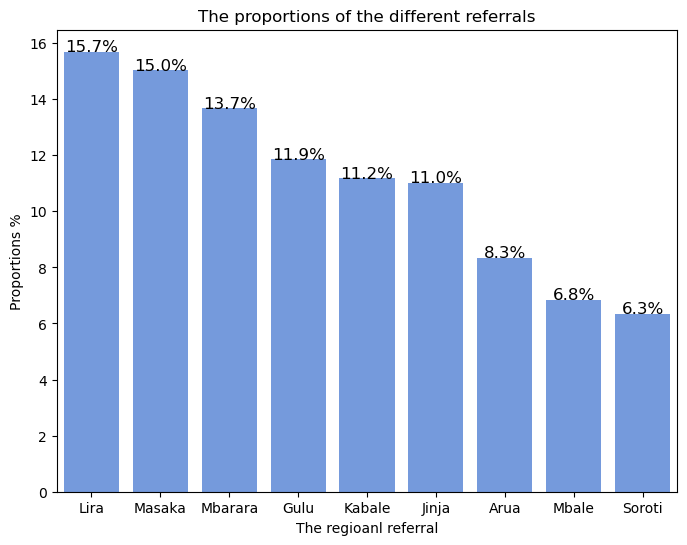

In [116]:
referral_count = data['name_of_rrh'].value_counts(normalize = True) * 100

plt.figure(figsize = (8,6))

ax = sns.barplot(x = referral_count.index, y = referral_count.values, color = 'cornflowerblue')

plt.title("The proportions of the different referrals")
plt.xlabel('The regioanl referral')
plt.ylabel("Proportions %")

# Show percentage values on bars
for i, val in enumerate(referral_count.values):
    plt.text(i, val, f"{val:.1f}%", ha='center', fontsize=12)
    

plt.show()

In [117]:
data['age'].describe()

count    598.000000
mean      30.272575
std       22.906648
min        0.000000
25%       12.000000
50%       28.000000
75%       44.000000
max       95.000000
Name: age, dtype: float64

In [118]:
data[data['age'].isna()].index

Index([567], dtype='int64')

In [119]:
data['age'] = data['age'].fillna(data['age'].median())

Text(0.5, 1.0, 'Age distribution')

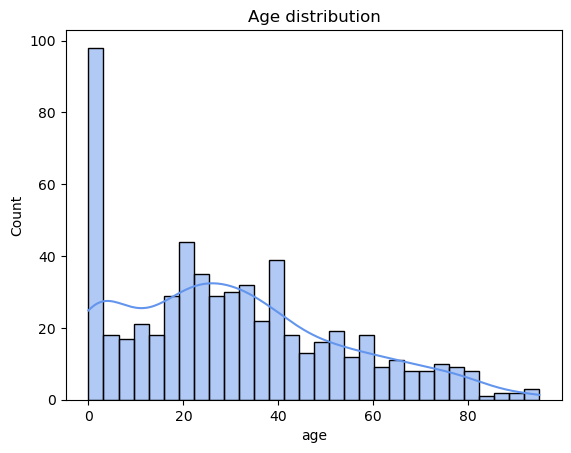

In [120]:
sns.histplot(data, x= 'age', bins = 30, kde = True, color = 'cornflowerblue')

plt.title("Age distribution")

In [121]:
data['sex'].info

<bound method Series.info of 0        Male
1        Male
2        Male
3        Male
4      Female
        ...  
594    Female
595    Female
596    Female
597    Female
598    Female
Name: sex, Length: 599, dtype: object>

/tmp/ipykernel_6215/332617357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax =sns.barplot(x = sex_count.index, y = sex_count.values, palette = 'Set1')


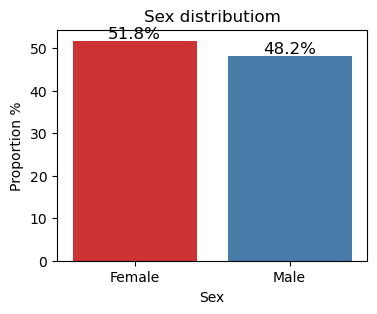

In [122]:
sex_count = data['sex'].value_counts(normalize = True)* 100

plt.figure(figsize = (4,3))

ax =sns.barplot(x = sex_count.index, y = sex_count.values, palette = 'Set1')

plt.title('Sex distributiom')
plt.xlabel('Sex')
plt.ylabel('Proportion %')

# Show percentage values on bars
for i, val in enumerate(sex_count.values):
    plt.text(i, val + 0.5, f"{val:.1f}%", ha='center', fontsize=12)

plt.show()

<Axes: xlabel='name_of_rrh', ylabel='age'>

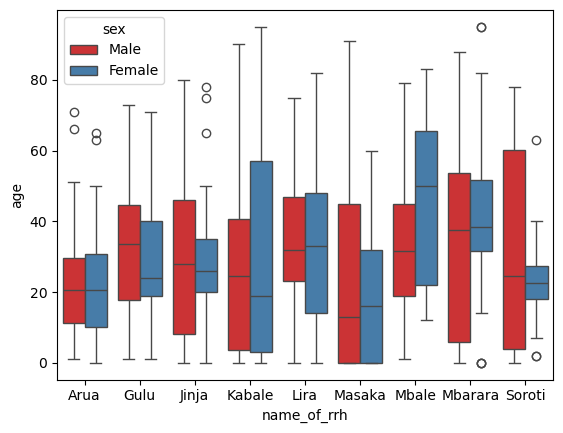

In [123]:
sns.boxplot(data, x= 'name_of_rrh', y = 'age', hue = 'sex', palette= 'Set1')

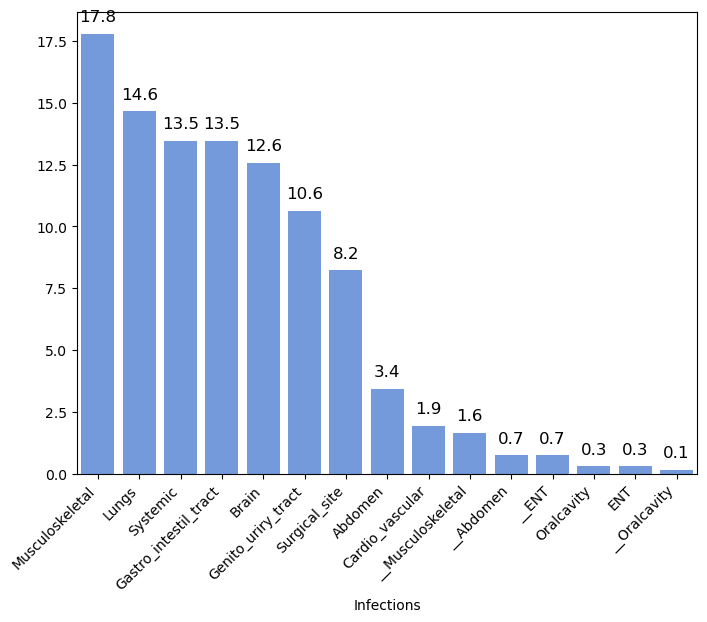

In [124]:
infection = pd.melt(
    data,
    id_vars = 'ward',
    value_vars= ['Infection_Site_1', 'Infection_Site_2', 'Infection_Site_3'],
    value_name= 'Infections'
)

infection.dropna(subset = 'Infections')

plt.figure(figsize = (8,6))

infection_count = infection['Infections'].value_counts(normalize = True)* 100

sns.barplot(x = infection_count.index , y = infection_count.values , color = 'cornflowerblue')

plt.xticks(rotation = 45, ha = 'right')

# Show percentage values on bars
for i, val in enumerate(infection_count.values):
    plt.text(i, val + 0.5, f"{val:.1f}", ha='center', fontsize=12)

plt.show()

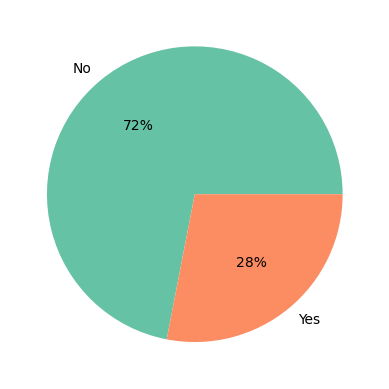

In [125]:
# define Seaborn color palette to use 
palette_color = sns.color_palette('Set2') 
referral_count =  data['referral'].value_counts(normalize = True)*100
  
# plotting data on chart 
plt.pie(referral_count.values, labels= referral_count.index, colors=palette_color, autopct='%.0f%%') 
  
# displaying chart 
plt.show() 

<function matplotlib.pyplot.show(close=None, block=None)>

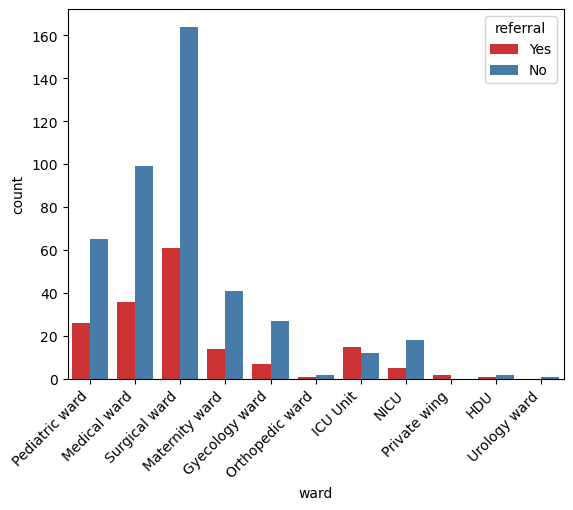

In [126]:
sns.countplot(data, x = 'ward', hue = 'referral', palette = 'Set1')

plt.xticks(rotation = 45, ha ='right')

plt.show

<Axes: xlabel='referral', ylabel='length_hosp_stay'>

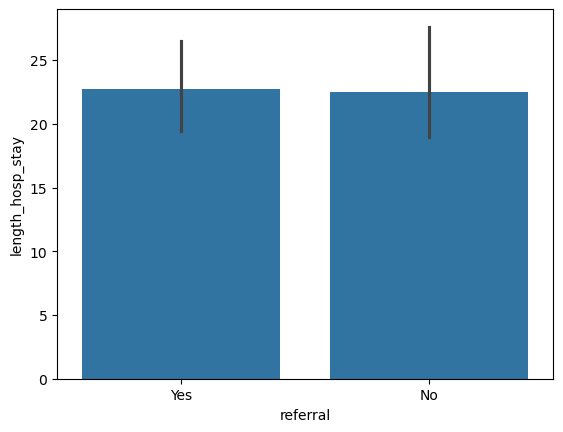

In [127]:
sns.barplot(data, x= 'referral', y = 'length_hosp_stay')

<Axes: xlabel='hiv_status', ylabel='length_hosp_stay'>

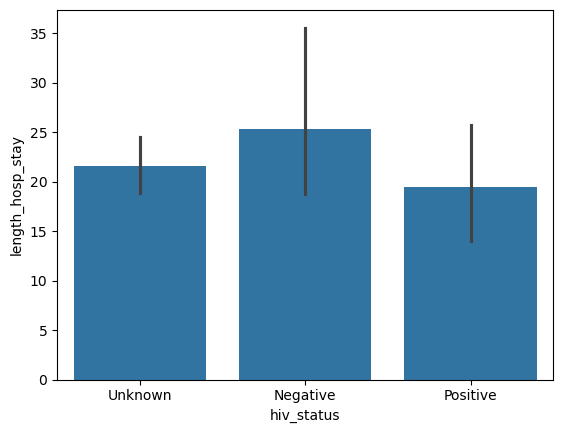

In [128]:
sns.barplot(data, x= 'hiv_status', y = 'length_hosp_stay')

In [129]:
data['intubated'] = data['intubated'].replace({'Unknown': 'No'})

<Axes: xlabel='intubated', ylabel='length_hosp_stay'>

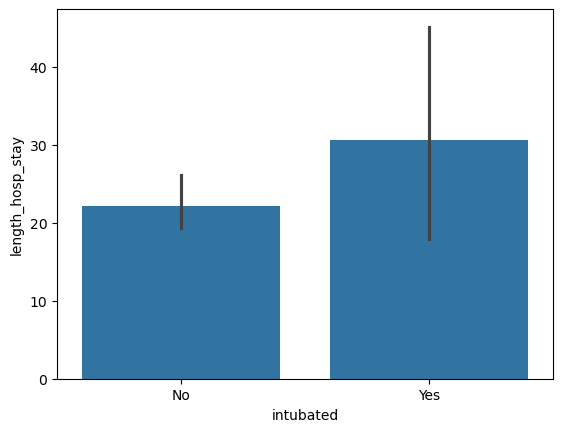

In [130]:
sns.barplot(data, x= 'intubated', y = 'length_hosp_stay')

In [131]:
# def check_prior_antibiotics(row):
#     for col in ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4']:
#         if pd.notna(row[col]):  # Check if the value is not NaN/None
#             return 'Yes'
#     return 'No'


# # Create the new 'Prio_antib' column
# data['Prio_antib'] = data.apply(check_prior_antibiotics, axis=1)

In [132]:
# drop the other columns of rior antibiotic use

data.drop(columns = ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4'], inplace = True, axis = 1)

In [133]:
# def resitance_check (row) :
#     if any(row[['Resistance1 ', 'Resistance2', 'Resistance3']] =='Yes'):
#         return 'Yes'
#     else:
#         return 'No'
    
# # Create a new column 'resistance' using the function
# data['resistance'] = data.apply(resitance_check, axis=1)

<Axes: xlabel='Resistance', ylabel='length_hosp_stay'>

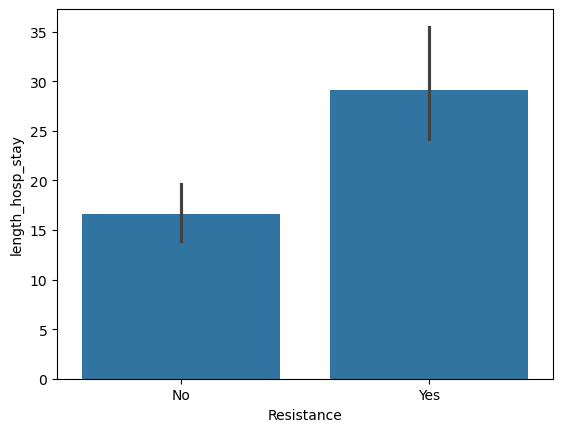

In [134]:
sns.barplot(data, x= 'Resistance', y = 'length_hosp_stay')

In [135]:
#data.drop(columns =['growth1'], inplace= True)

In [136]:
# HDU, ICU , NICU ----- ICU
# Orthopedic, private, urology - medical ward

data['ward'].replace({'HDU':'ICU Unit', 'NICU':'ICU Unit', 'Private wing':'Medical ward', 'Gyecology ward':'Medical ward','Urology ward':'Medical ward', 'Orthopedic ward':'Medical ward'}, inplace=True)

/tmp/ipykernel_6215/3353176426.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['ward'].replace({'HDU':'ICU Unit', 'NICU':'ICU Unit', 'Private wing':'Medical ward', 'Gyecology ward':'Medical ward','Urology ward':'Medical ward', 'Orthopedic ward':'Medical ward'}, inplace=True)


In [137]:
data.drop(columns= ['antib_aft_culture', 'antibiotics'], inplace = True)

# Filling missingness

## Infections sites

In [138]:
def infection_missing(df) :
    for col in ['Infection_Site_1', 'Infection_Site_2', 'Infection_Site_3']:
        if pd.isna(df[col]):
            df[col] = 'No infection'
    return df

data = data.apply(infection_missing, axis = 1)

## Prio antibiotics taken

In [139]:
# def prio_antib_missing(df) :
#     for col in ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4']:
#         if pd.isna(df[col]):
#             df[col] = 'UNK'
#     return df

# data = data.apply(prio_antib_missing, axis = 1)

## Cormobidity

In [140]:
# def cormobidity_missing(df) :
#     for col in ['Comobidity1', 'Comobidity2', 'Comobidity3']:
#         if pd.isna(df[col]):
#             df[col] = 'UNK'
#     return df

# data = data.apply(cormobidity_missing, axis = 1)

## Antibiotic prescribed

In [141]:
def Prescribed_antib_missing(df) :
    for col in ['Prescribed_antib_1', 'Prescribed_antib_2', 'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5']:
        if pd.isna(df[col]):
            df[col] = 'No antibiotic prescribed'
    return df

data = data.apply(Prescribed_antib_missing, axis = 1)

## Pathogens

In [142]:
def pathogen_missing(df) :
    for col in ['first_organism', 'sec_organism', 'third_organism']:
        if pd.isna(df[col]):
            df[col] = 'No pathogen'
    return df

data = data.apply(pathogen_missing, axis = 1)

## Antibiotics after culture

In [143]:
def antib_aft_missing(df) :
    for col in ['Antibioitic_aft_cul_1', 'Antibioitic_aft_cul_2']:
        if pd.isna(df[col]):
            df[col] = 'No antibiotic precibed'
    return df

data = data.apply(antib_aft_missing, axis = 1)

## antibiotics

In [144]:
# def Antibiotics(df) :
#     for col in ['antibiotics']:
#         if pd.isna(df[col]):
#             df[col] = 'No'
#     return df

# data = data.apply(Antibiotics, axis = 1)

## antibiotics after culture (Yes/No)

In [145]:
# def Antibiotics_aft(df) :
#     for col in ['antib_aft_culture']:
#         if pd.isna(df[col]):
#             df[col] = 'No'
#     return df

# data = data.apply(Antibiotics_aft, axis = 1)

## Complications

In [146]:
def Complications(df) :
    for col in ['complications']:
        if pd.isna(df[col]):
            df[col] = 'No'
    return df

data = data.apply(Complications, axis = 1)

## length of hospital stay

In [147]:
data.dropna(subset = 'length_hosp_stay', inplace = True)

# Encoding data

## Label Encoding

In [148]:
from sklearn.preprocessing import LabelEncoder

Le = LabelEncoder()

In [149]:
columns_to_encode = data.drop(columns = ['age', 'length_hosp_stay', 'referral', 'sex', 'intubated', 'Resistance',  'complications'])

for column in columns_to_encode:
    data[column] = Le.fit_transform(data[column])

## One hot encoding

In [150]:
#sex
data['sex'] = data['sex'].replace({'Male': 0, 'Female': 1})

/tmp/ipykernel_6215/1529081699.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['sex'] = data['sex'].replace({'Male': 0, 'Female': 1})


In [151]:
data = data.replace ({'Yes': 1, "No": 0})

/tmp/ipykernel_6215/2147984969.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data = data.replace ({'Yes': 1, "No": 0})


In [152]:
data.tail()

,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,Infection_Site_3,referral,ward,antib_prior_admi,sympt_dura,...,growth1,first_organism,sec_organism,third_organism,Resistance,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,complications,treatment_outcome,length_hosp_stay
594,8,2.0,1,7,4,2,0,3,1,2,...,0,13,10,3,0,15,10,0,0,10.0
595,8,27.0,1,10,4,2,0,1,2,2,...,1,21,10,3,1,15,10,0,0,3.0
596,8,20.0,1,10,4,2,0,1,1,2,...,0,13,10,3,0,15,10,0,0,6.0
597,8,24.0,1,10,4,2,1,1,1,4,...,0,13,10,3,0,15,10,0,1,8.0
598,8,2.0,1,6,4,2,0,3,1,2,...,1,21,10,3,1,7,6,0,0,21.0


# Correlation 

Correaltion with the target variable and also how the different variable correlate with each other

/tmp/ipykernel_6215/848355969.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdBu')


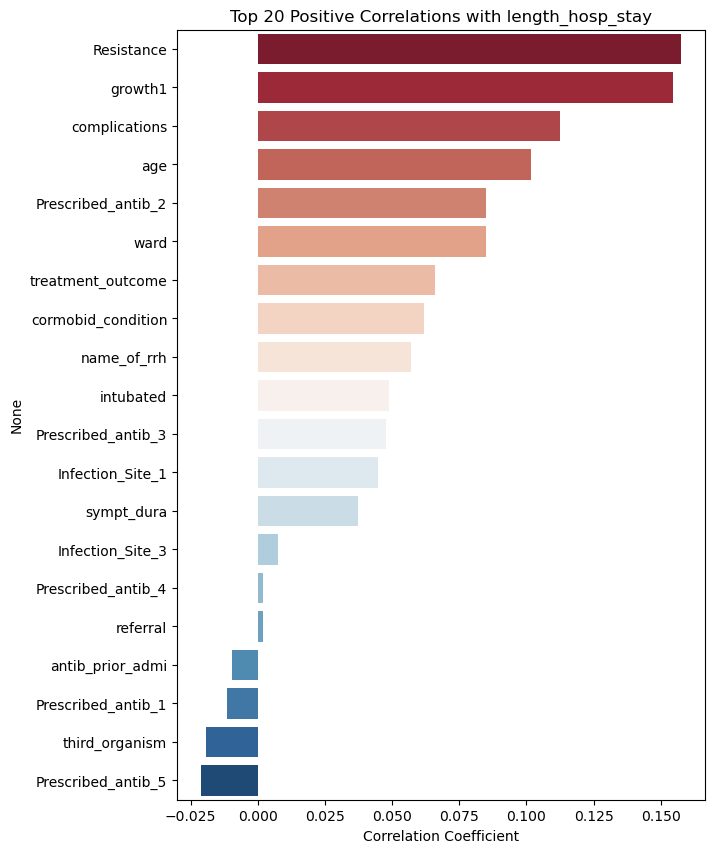

In [153]:
def plot_correlations(df, target_column, n_top = 39):
    
    # Calculate correlations with target variable
    correlations = df.corr()[target_column].sort_values(ascending=False)
    
    # Get top N most correlated features (excluding the target itself)
    top_corr = correlations[1:n_top+1]
    
    # Create figure with two subplots
    plt.figure(figsize=(15, 10))
    
    # Plot 1: Horizontal bar chart of top correlations
    plt.subplot(1, 2, 1)
    sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdBu')
    plt.title(f'Top {n_top} Positive Correlations with {target_column}')
    plt.xlabel('Correlation Coefficient')

plot_correlations(data, 'length_hosp_stay', n_top=20)

<Figure size 1500x1000 with 0 Axes>

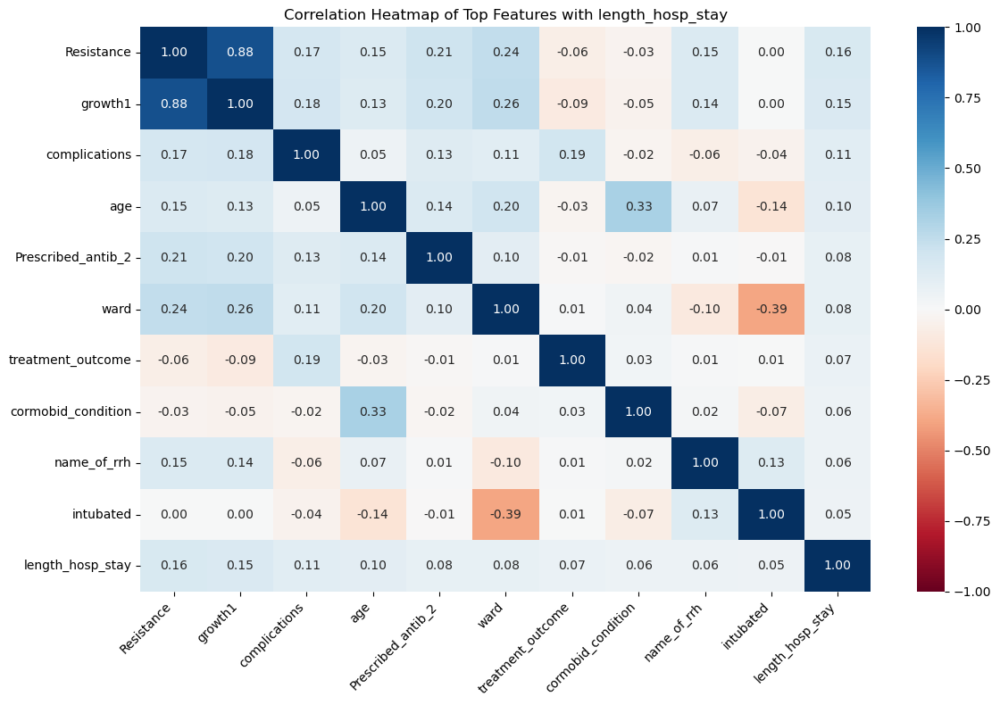

In [154]:
def plot_correlations(df, target_column, n_top=20):
    
    # Calculate correlations with target variable
    correlations = df.corr()[target_column].sort_values(ascending=False)
    
    # Get top N most correlated features (excluding the target itself)
    top_corr = correlations[1:n_top+1]
    #bottom_corr = correlations[-(n_top):]
    
    # Create figure with two subplots
    plt.figure(figsize=(15, 10))
    
    # Create heatmap of top correlated features
    plt.figure(figsize=(12, 8))
    top_features = list(top_corr.index[:10]) + [target_column]  # Top 10 + target
    correlation_matrix = df[top_features].corr()
    
    sns.heatmap(correlation_matrix, 
                annot=True,
                cmap='RdBu',
                vmin=-1, 
                vmax=1,
                center=0,
                fmt='.2f')
    plt.title(f'Correlation Heatmap of Top Features with {target_column}')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

plot_correlations(data, 'length_hosp_stay', n_top=20)

# ML

## Data

In [155]:
growth = data[data['growth1']==1]

print(growth.shape)

growth.head()

(324, 29)


,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,Infection_Site_3,referral,ward,antib_prior_admi,sympt_dura,...,growth1,first_organism,sec_organism,third_organism,Resistance,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,complications,treatment_outcome,length_hosp_stay
3,0,18.0,0,10,4,2,1,4,1,2,...,1,4,10,3,1,15,10,1,1,0.0
4,0,17.0,1,10,4,2,1,1,1,2,...,1,9,10,3,1,6,10,1,1,10.0
5,0,29.0,0,7,4,2,1,4,1,0,...,1,10,12,0,1,11,10,0,1,69.0
8,0,50.0,1,9,4,2,1,4,1,0,...,1,10,10,3,1,15,10,0,2,5.0
11,0,30.0,1,7,4,2,0,2,1,3,...,1,9,10,3,1,15,10,0,0,45.0


In [156]:
growth.drop(columns = ['growth1'], inplace = True)

/tmp/ipykernel_6215/576020328.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  growth.drop(columns = ['growth1'], inplace = True)


In [158]:
growth.drop(columns = [
    'intubated',  
    'Infection_Site_3', 
    'Antibioitic_aft_cul_2',
    'Infection_Site_3',
    'third_organism',
    'Prescribed_antib_4',
    'Prescribed_antib_5'
], inplace = True)

/tmp/ipykernel_6215/3329988240.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  growth.drop(columns = [


In [159]:
growth.drop(columns = ['treatment_outcome'], inplace = True)

/tmp/ipykernel_6215/2667094753.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  growth.drop(columns = ['treatment_outcome'], inplace = True)


In [160]:
growth.to_csv('Patients with growth.csv', index = False)

In [161]:
no_growth = data[data['growth1'] == 0]

print(no_growth.shape)

no_growth.head()

(272, 29)


,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,Infection_Site_3,referral,ward,antib_prior_admi,sympt_dura,...,growth1,first_organism,sec_organism,third_organism,Resistance,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,complications,treatment_outcome,length_hosp_stay
0,0,6.0,0,1,4,2,1,3,1,2,...,0,13,10,3,0,15,10,0,1,12.0
1,0,13.0,0,6,6,2,1,2,1,0,...,0,13,10,3,0,15,10,0,1,8.0
2,0,11.0,0,11,4,2,0,3,1,2,...,0,13,10,3,0,15,10,1,1,14.0
6,0,8.0,1,1,4,2,0,3,1,0,...,0,13,10,3,0,15,10,0,1,6.0
7,0,10.0,1,11,4,2,1,3,1,4,...,0,13,10,3,0,15,10,0,1,11.0


In [162]:
growth.to_csv('ML data 2.csv', index = False)

## Modelling

# Huber model

2025/03/04 08:52:46 WARNING mlflow.utils.git_utils: Failed to import Git (the Git executable is probably not on your PATH), so Git SHA is not available. Error: Failed to initialize: Bad git executable.
The git executable must be specified in one of the following ways:
    - be included in your $PATH
    - be set via $GIT_PYTHON_GIT_EXECUTABLE
    - explicitly set via git.refresh(<full-path-to-git-executable>)

All git commands will error until this is rectified.

This initial message can be silenced or aggravated in the future by setting the
$GIT_PYTHON_REFRESH environment variable. Use one of the following values:
    - quiet|q|silence|s|silent|none|n|0: for no message or exception
    - warn|w|warning|log|l|1: for a warning message (logging level CRITICAL, displayed by default)
    - error|e|exception|raise|r|2: for a raised exception

Example:
    export GIT_PYTHON_REFRESH=quiet

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inf

Mean Absolute Error: 16.93
Root Mean Squared Error: 28.06
R-squared Score: -0.0943


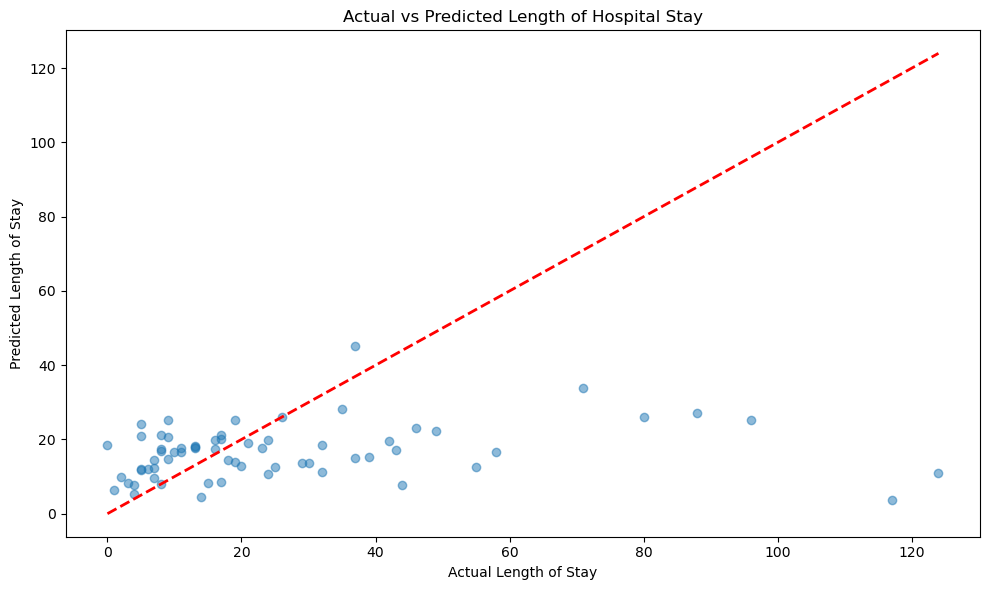

In [163]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import HuberRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters
params = {
    'epsilon': 1.75,
    'max_iter': 500,
    'alpha': 0.1
}

# Train the model
huber = HuberRegressor(**params)
huber.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = huber.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(huber, "huber_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()], 
         [y_test_original.min(), y_test_original.max()], 
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay')
plt.tight_layout()
plt.show()

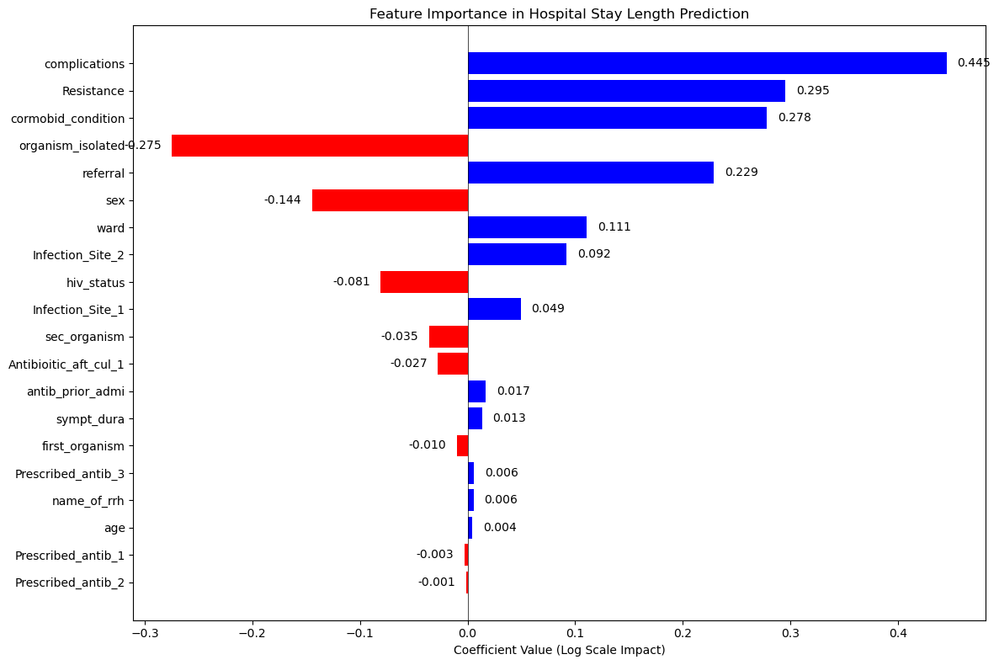


Feature Importance Rankings:
              feature  coefficient  abs_coefficient
        complications     0.445030         0.445030
           Resistance     0.295154         0.295154
   cormobid_condition     0.277848         0.277848
    organism_isolated    -0.274562         0.274562
             referral     0.228803         0.228803
                  sex    -0.144114         0.144114
                 ward     0.110923         0.110923
     Infection_Site_2     0.091767         0.091767
           hiv_status    -0.080661         0.080661
     Infection_Site_1     0.049249         0.049249
         sec_organism    -0.035401         0.035401
Antibioitic_aft_cul_1    -0.027437         0.027437
     antib_prior_admi     0.016664         0.016664
           sympt_dura     0.013486         0.013486
       first_organism    -0.009746         0.009746
   Prescribed_antib_3     0.006051         0.006051
          name_of_rrh     0.005642         0.005642
                  age     0.004249

In [164]:
# Get feature names and coefficients
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'coefficient': huber.coef_
})

# Sort by absolute value of coefficient while keeping the sign
feature_importance['abs_coef'] = abs(feature_importance['coefficient'])
feature_importance = feature_importance.sort_values('abs_coef', ascending=True)

# Create a horizontal bar plot
plt.figure(figsize=(12, 8))
colors = ['red' if c < 0 else 'blue' for c in feature_importance['coefficient']]
bars = plt.barh(feature_importance['feature'], feature_importance['coefficient'], color=colors)

# Add vertical line at x=0
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)

# Customize the plot
plt.title('Feature Importance in Hospital Stay Length Prediction')
plt.xlabel('Coefficient Value (Log Scale Impact)')

# Add value labels on the bars
for bar in bars:
    width = bar.get_width()
    label_x = width + (0.01 if width >= 0 else -0.01)
    plt.text(label_x, bar.get_y() + bar.get_height()/2, 
             f'{width:.3f}',
             ha='left' if width >= 0 else 'right', 
             va='center')

plt.tight_layout()
plt.show()

# Print detailed feature importance table
feature_importance['abs_coefficient'] = abs(feature_importance['coefficient'])
feature_importance = feature_importance.sort_values('abs_coefficient', ascending=False)
print("\nFeature Importance Rankings:")
print(feature_importance[['feature', 'coefficient', 'abs_coefficient']].to_string(index=False))

# Calculate percentage influence
total_importance = feature_importance['abs_coefficient'].sum()
feature_importance['influence_percentage'] = (feature_importance['abs_coefficient'] / total_importance * 100)

print("\nTop 5 Most Influential Features:")
top_5 = feature_importance.head()
for _, row in top_5.iterrows():
    direction = "increases" if row['coefficient'] > 0 else "decreases"
    print(f"{row['feature']}: {row['influence_percentage']:.1f}% influence ({direction} length of stay)")

In [165]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow huber model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Huber model")

    # Infer the model signature
    signature = infer_signature(X_train, huber.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="Huber_model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'Huber_model' already exists. Creating a new version of this model...
2025/03/04 08:52:51 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: H

🏃 View run whimsical-bee-382 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/a3656caa3fc7422aa7a5c346b2f15114
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


Created version '20' of model 'Huber_model'.


In [166]:
# Load the model back for predictions as a generic Python Function model
loaded_model = mlflow.pyfunc.load_model(model_info.model_uri)

predictions = loaded_model.predict(X_test)

dataset_names = growth.columns

result = pd.DataFrame(X_test, columns=dataset_names)
result["actual_class"] = y_test
result["predicted_class"] = predictions

result[:10]

,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,referral,ward,antib_prior_admi,sympt_dura,hiv_status,...,Prescribed_antib_3,organism_isolated,first_organism,sec_organism,Resistance,Antibioitic_aft_cul_1,complications,length_hosp_stay,actual_class,predicted_class
277,4,18.0,1,10,4,0,2,1,2,2,...,13,0,1,10,1,15,0,NaN,3.401197,2.689832
230,3,0.0,1,6,4,0,3,1,2,0,...,3,0,9,10,1,15,0,NaN,2.079442,2.581942
286,4,39.0,0,7,4,0,4,0,2,2,...,3,1,9,16,1,5,0,NaN,4.025352,2.611237
20,0,21.0,1,5,4,0,1,1,2,2,...,3,0,9,10,1,15,0,NaN,1.386294,2.212902
377,5,47.0,0,5,4,0,4,0,1,2,...,3,0,11,10,1,15,0,NaN,3.091042,3.001400
264,4,30.0,1,1,8,0,2,1,0,2,...,12,0,22,10,0,15,0,NaN,1.609438,2.156620
446,6,22.0,1,8,4,0,4,1,4,2,...,3,1,21,12,1,6,0,NaN,4.828314,2.481036
400,5,0.0,1,11,4,0,0,0,2,0,...,3,0,20,10,1,15,0,NaN,1.098612,2.382837
510,7,80.0,0,2,4,0,2,0,2,2,...,3,0,19,10,1,5,0,NaN,3.637586,2.770599
302,4,43.0,1,7,4,0,4,1,2,1,...,11,0,19,10,1,6,0,NaN,4.394449,3.301838


## Hyperparameter tuning

In [167]:
import optuna

def objective(trial):
    """Function to optimize hyperparameters."""
    with mlflow.start_run():
        # Suggest hyperparameters
        epsilon = trial.suggest_float("epsilon", 1.1, 2.0)
        max_iter = trial.suggest_int("max_iter", 500, 2000, step=500)
        alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
        
        # Train the model
        model = HuberRegressor(epsilon=epsilon, max_iter=max_iter, alpha=alpha)
        model.fit(X_train, y_train)

        # Predict
        y_pred = model.predict(X_test)

        # Compute metric
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Log parameters and metrics to MLflow
        mlflow.log_params({"epsilon": epsilon, "max_iter": max_iter, "alpha": alpha})
        mlflow.log_metric("MAE", mae)
        mlflow.log_metric('MSE', mse)
        mlflow.log_metric('R2', r2)

        return mae  # Optuna minimizes this

# Run optimization
study = optuna.create_study(direction="minimize")  # Minimize MAE
study.optimize(objective, n_trials=20)

# Print best parameters
print("Best parameters:", study.best_params)


[I 2025-03-04 08:52:51,650] A new study created in memory with name: no-name-d6b524ae-4b09-4d33-a34a-2010a7abaf46
/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:51,717] Trial 0 finished with value: 0.7505618919647377 and parameters: {'epsilon': 1.3162823680293096, 'max_iter': 1000, 'alpha': 0.0003320939322815397}. Best is trial 0 with value: 0.7505618919647377.
/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:51,783] Trial 1 finished with value: 0.74489498

🏃 View run respected-slug-799 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/feec098c35f442fb8a461105af64b95a
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run dashing-stork-930 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/a720f2931d7e49e9b77af8b0932aa8e2
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run painted-dove-530 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/e3011e3470044e789a45e92097ba42d7
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run stylish-rat-463 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/2dc0ec62041d4719a265e98241070018
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:51,967] Trial 4 finished with value: 0.7507144911659168 and parameters: {'epsilon': 1.3241360474916353, 'max_iter': 1500, 'alpha': 0.006583869069397409}. Best is trial 2 with value: 0.7448794537159655.
/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,036] Trial 5 finished with value: 0.7460140040266406 and parameters: {'epsilon': 1.636913099032761, 'max_iter': 1000, 'alpha': 0.0006755759926362313}. Best is 

🏃 View run righteous-turtle-210 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/e9c5c2585b344230a81a7a48da19731c
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run languid-kite-147 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/96d9c79f3ef34f6aa9b1d54305a3804b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run mysterious-ant-151 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/3d1f20a74c3c4a479292f37f7b0b519b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run intrigued-gnat-984 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/36f705c71f524c7ebcdb29fba80168bc
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,226] Trial 8 finished with value: 0.7448672746988727 and parameters: {'epsilon': 1.9474014357978675, 'max_iter': 500, 'alpha': 0.009359497192371601}. Best is trial 8 with value: 0.7448672746988727.
/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,286] Trial 9 finished with value: 0.7505749736823849 and parameters: {'epsilon': 1.3847129247537495, 'max_iter': 2000, 'alpha': 3.6800918631463236e-05}. Best is

🏃 View run clumsy-doe-135 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/0914e569073543cb9ef11e83c0b9d95d
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run placid-bass-389 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/7d22f5d5153f447bb77adb73188e1255
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run fearless-crow-248 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/1744103c2a1f4841a7a4a588fd067f38
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,435] Trial 11 finished with value: 0.744914147565687 and parameters: {'epsilon': 1.9851263812267157, 'max_iter': 2000, 'alpha': 9.292717535747355e-05}. Best is trial 8 with value: 0.7448672746988727.
/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,496] Trial 12 finished with value: 0.7452223970874743 and parameters: {'epsilon': 1.7936692507584269, 'max_iter': 1500, 'alpha': 0.00021399698566156492}. Best

🏃 View run bustling-midge-591 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/c0c692894d4a4591a4e077002bb27686
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run vaunted-bee-579 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/7b5084788dd5483595ec04e2d738abb0
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run popular-ray-370 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/4bdb06751d66448f8ca91880024f660b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run polite-deer-247 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/d2a4d6781d87416b87d6cecf4f60dcdd
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,688] Trial 15 finished with value: 0.7471050116154904 and parameters: {'epsilon': 1.5134157737334988, 'max_iter': 1500, 'alpha': 0.0003475637345221058}. Best is trial 8 with value: 0.7448672746988727.
/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,750] Trial 16 finished with value: 0.7449040648340652 and parameters: {'epsilon': 1.8646837405078662, 'max_iter': 2000, 'alpha': 0.00011840435018184546}. Bes

🏃 View run puzzled-bee-430 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/8151e8c02668424b9e2548077faa1938
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run adaptable-gnat-228 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/4c1722ad5a74493ea9eb5dee35e86ed9
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run welcoming-goose-971 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/d7bfd83513424f3692dd3dbc59f92605
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run hilarious-perch-476 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/83ad76f38c064a4c85b0315b387f2ccd
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_6215/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-04 08:52:52,942] Trial 19 finished with value: 0.7448700377740973 and parameters: {'epsilon': 1.9105508126268507, 'max_iter': 1000, 'alpha': 3.45928385419204e-05}. Best is trial 8 with value: 0.7448672746988727.


🏃 View run redolent-fox-467 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/c309de365a6b4987a2cf0e6046e26070
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
Best parameters: {'epsilon': 1.9474014357978675, 'max_iter': 500, 'alpha': 0.009359497192371601}


In [168]:
# Load the model back for predictions as a generic Python Function model
loaded_model = mlflow.pyfunc.load_model(model_info.model_uri)

predictions = loaded_model.predict(X_test)

dataset_names = growth.columns

result = pd.DataFrame(X_test, columns=dataset_names)
result["actual_class"] = y_test
result["predicted_class"] = predictions

result[:10]

,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,referral,ward,antib_prior_admi,sympt_dura,hiv_status,...,Prescribed_antib_3,organism_isolated,first_organism,sec_organism,Resistance,Antibioitic_aft_cul_1,complications,length_hosp_stay,actual_class,predicted_class
277,4,18.0,1,10,4,0,2,1,2,2,...,13,0,1,10,1,15,0,NaN,3.401197,2.689832
230,3,0.0,1,6,4,0,3,1,2,0,...,3,0,9,10,1,15,0,NaN,2.079442,2.581942
286,4,39.0,0,7,4,0,4,0,2,2,...,3,1,9,16,1,5,0,NaN,4.025352,2.611237
20,0,21.0,1,5,4,0,1,1,2,2,...,3,0,9,10,1,15,0,NaN,1.386294,2.212902
377,5,47.0,0,5,4,0,4,0,1,2,...,3,0,11,10,1,15,0,NaN,3.091042,3.001400
264,4,30.0,1,1,8,0,2,1,0,2,...,12,0,22,10,0,15,0,NaN,1.609438,2.156620
446,6,22.0,1,8,4,0,4,1,4,2,...,3,1,21,12,1,6,0,NaN,4.828314,2.481036
400,5,0.0,1,11,4,0,0,0,2,0,...,3,0,20,10,1,15,0,NaN,1.098612,2.382837
510,7,80.0,0,2,4,0,2,0,2,2,...,3,0,19,10,1,5,0,NaN,3.637586,2.770599
302,4,43.0,1,7,4,0,4,1,2,1,...,11,0,19,10,1,6,0,NaN,4.394449,3.301838


Fitting 5 folds for each of 25 candidates, totalling 125 fits


/home/kyomukama/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/kyomukama/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/kyomukama/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LI

Best parameters: {'alpha': 0.1, 'epsilon': 2.0, 'max_iter': 500}
Best cross-validation score (RMSE): 0.9712460779412917

Top 5 parameter combinations:
                                               params      rmse  \
24    {'alpha': 0.1, 'epsilon': 2.0, 'max_iter': 500}  0.971246   
23   {'alpha': 0.1, 'epsilon': 1.75, 'max_iter': 500}  0.971248   
19   {'alpha': 0.05, 'epsilon': 2.0, 'max_iter': 500}  0.971311   
4   {'alpha': 0.001, 'epsilon': 2.0, 'max_iter': 500}  0.971334   
9   {'alpha': 0.005, 'epsilon': 2.0, 'max_iter': 500}  0.971369   

    std_test_score  
24        0.108828  
23        0.107446  
19        0.108719  
4         0.108684  
9         0.108805  


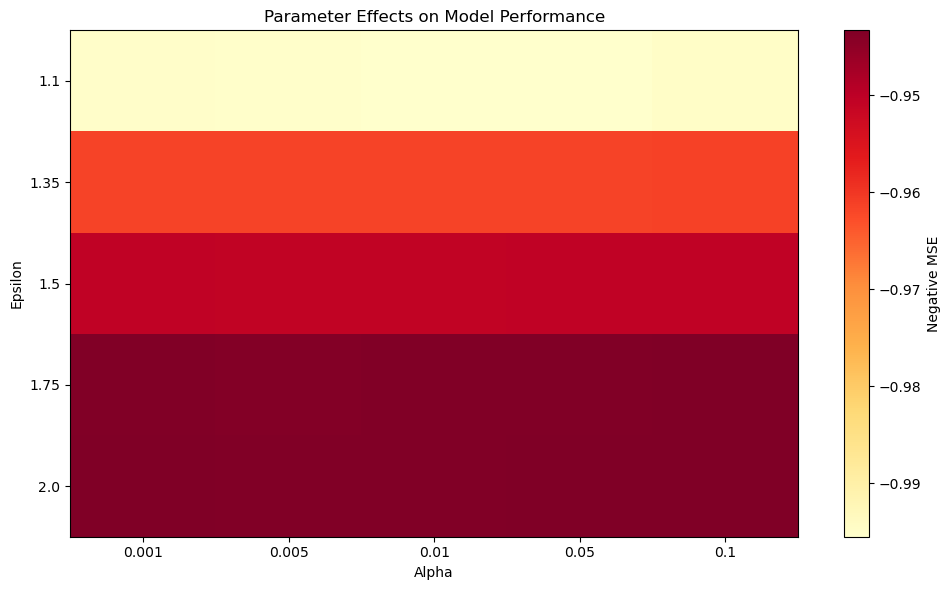


Feature Importances:
                  feature  coefficient
19          complications     0.412789
10     cormobid_condition     0.231436
17             Resistance     0.221469
5                referral     0.207863
14      organism_isolated    -0.172269
2                     sex    -0.126402
6                    ward     0.096204
4        Infection_Site_2     0.070288
3        Infection_Site_1     0.045423
18  Antibioitic_aft_cul_1    -0.038790
9              hiv_status    -0.030067
8              sympt_dura     0.024802
16           sec_organism    -0.018712
15         first_organism    -0.006731
7        antib_prior_admi     0.005489
1                     age     0.004985
13     Prescribed_antib_3     0.003807
11     Prescribed_antib_1     0.003655
0             name_of_rrh     0.001801
12     Prescribed_antib_2     0.001526

Cross-validation RMSE scores:
Mean RMSE: 0.9697 (+/- 0.1105)


In [169]:
from sklearn.model_selection import GridSearchCV

# Prepare the data (using log transform as before)
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])

# Define parameter grid
param_grid = {
    'epsilon': [1.1, 1.35, 1.5, 1.75, 2.0],
    'alpha': [0.001, 0.005, 0.01, 0.05, 0.1],
    'max_iter': [500]  # Fixed as it's more of a computational parameter
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(
    HuberRegressor(),
    param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

# Fit the grid search
grid_search.fit(X, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score (RMSE):", np.sqrt(-grid_search.best_score_))

# Get detailed results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results = cv_results.sort_values('rank_test_score')

# Print top 5 parameter combinations
print("\nTop 5 parameter combinations:")
top_5 = cv_results[['params', 'mean_test_score', 'std_test_score']].head()
top_5['rmse'] = np.sqrt(-top_5['mean_test_score'])
print(top_5[['params', 'rmse', 'std_test_score']])

# Plot parameter effects
import matplotlib.pyplot as plt

# Create epsilon vs alpha heatmap
pivot_table = cv_results.pivot_table(
    values='mean_test_score',
    index='param_epsilon',
    columns='param_alpha'
)

plt.figure(figsize=(10, 6))
plt.imshow(pivot_table, cmap='YlOrRd', aspect='auto')
plt.colorbar(label='Negative MSE')
plt.xticks(range(len(param_grid['alpha'])), param_grid['alpha'])
plt.yticks(range(len(param_grid['epsilon'])), param_grid['epsilon'])
plt.xlabel('Alpha')
plt.ylabel('Epsilon')
plt.title('Parameter Effects on Model Performance')
plt.tight_layout()
plt.show()

# Train final model with best parameters
best_model = HuberRegressor(**grid_search.best_params_)
best_model.fit(X, y)

# Get feature importances
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'coefficient': best_model.coef_
})
feature_importance = feature_importance.sort_values('coefficient', key=abs, ascending=False)

print("\nFeature Importances:")
print(feature_importance)

# Validate the model using cross-validation scores
from sklearn.model_selection import cross_val_score
cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(-cv_scores)

print("\nCross-validation RMSE scores:")
print(f"Mean RMSE: {rmse_scores.mean():.4f} (+/- {rmse_scores.std() * 2:.4f})")

# Random Forest Regressor


/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run capricious-steed-202 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/382af957c7814e658bbf8b2a013df430
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
Mean Absolute Error: 15.89
Root Mean Squared Error: 26.37
R-squared Score: 0.0334


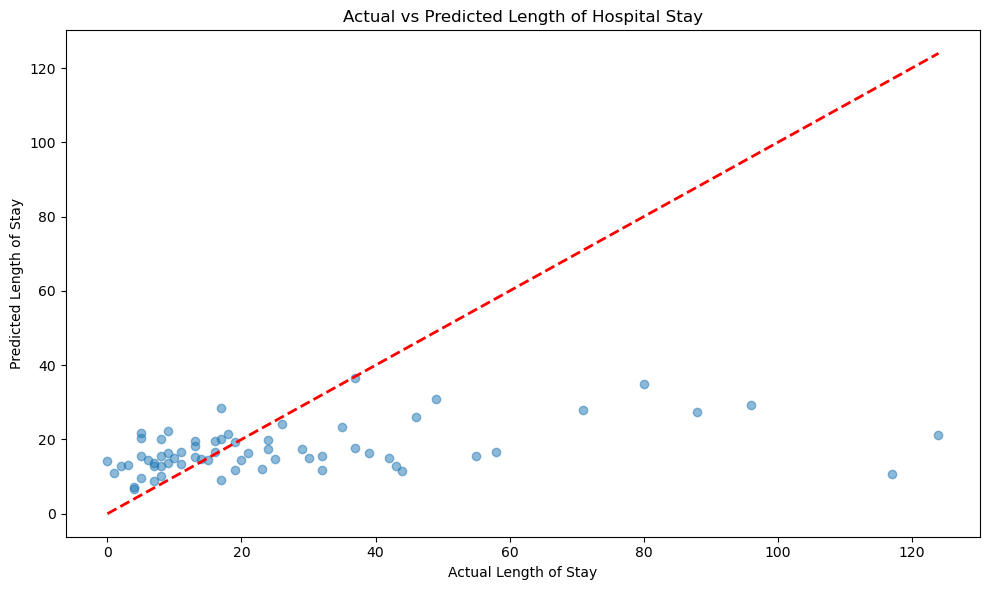

In [170]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters
params = {
    'random_state':10,
    'n_estimators': 1250, 
    'min_samples_split': 10, 
    'min_samples_leaf': 4, 
    'max_features': 0.7, 
    'max_depth': 20, 
    'bootstrap': True
}

rf = RandomForestRegressor(**params)
rf.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = rf.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(rf, "Rf_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()], 
         [y_test_original.min(), y_test_original.max()], 
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay')
plt.tight_layout()
plt.show()

In [171]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow RandomForest Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Random Forest Regressor model")

    # Infer the model signature
    signature = infer_signature(X_train, rf.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="RandomForest Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'RandomForest Regressor model' already exists. Creating a new version of this model...
2025/03/04 08:53:00 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creati

🏃 View run marvelous-mare-629 at: http://127.0.0.1:8080/#/experiments/320510952361426209/runs/cdd214468164417094656989a5f6196d
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/320510952361426209


Created version '26' of model 'RandomForest Regressor model'.


In [172]:
# Load the model back for predictions as a generic Python Function model
loaded_model = mlflow.pyfunc.load_model(model_info.model_uri)

predictions = loaded_model.predict(X_test)

dataset_names = growth.columns

result = pd.DataFrame(X_test, columns=dataset_names)
result["actual_class"] = y_test
result["predicted_class"] = predictions

result[:10]

,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,referral,ward,antib_prior_admi,sympt_dura,hiv_status,...,Prescribed_antib_3,organism_isolated,first_organism,sec_organism,Resistance,Antibioitic_aft_cul_1,complications,length_hosp_stay,actual_class,predicted_class
277,4,18.0,1,10,4,0,2,1,2,2,...,13,0,1,10,1,15,0,NaN,3.401197,2.689832
230,3,0.0,1,6,4,0,3,1,2,0,...,3,0,9,10,1,15,0,NaN,2.079442,2.581942
286,4,39.0,0,7,4,0,4,0,2,2,...,3,1,9,16,1,5,0,NaN,4.025352,2.611237
20,0,21.0,1,5,4,0,1,1,2,2,...,3,0,9,10,1,15,0,NaN,1.386294,2.212902
377,5,47.0,0,5,4,0,4,0,1,2,...,3,0,11,10,1,15,0,NaN,3.091042,3.001400
264,4,30.0,1,1,8,0,2,1,0,2,...,12,0,22,10,0,15,0,NaN,1.609438,2.156620
446,6,22.0,1,8,4,0,4,1,4,2,...,3,1,21,12,1,6,0,NaN,4.828314,2.481036
400,5,0.0,1,11,4,0,0,0,2,0,...,3,0,20,10,1,15,0,NaN,1.098612,2.382837
510,7,80.0,0,2,4,0,2,0,2,2,...,3,0,19,10,1,5,0,NaN,3.637586,2.770599
302,4,43.0,1,7,4,0,4,1,2,1,...,11,0,19,10,1,6,0,NaN,4.394449,3.301838



Feature Importance with Best Parameters:
                  feature  importance
1                     age    0.211491
3        Infection_Site_1    0.093786
0             name_of_rrh    0.086256
18  Antibioitic_aft_cul_1    0.080532
15         first_organism    0.077619
19          complications    0.065716
11     Prescribed_antib_1    0.056192
12     Prescribed_antib_2    0.052836
8              sympt_dura    0.035180
6                    ward    0.032682
9              hiv_status    0.031124
16           sec_organism    0.029476
10     cormobid_condition    0.025743
7        antib_prior_admi    0.025150
2                     sex    0.024409
13     Prescribed_antib_3    0.018019
5                referral    0.016117
14      organism_isolated    0.013863
4        Infection_Site_2    0.013590
17             Resistance    0.010220


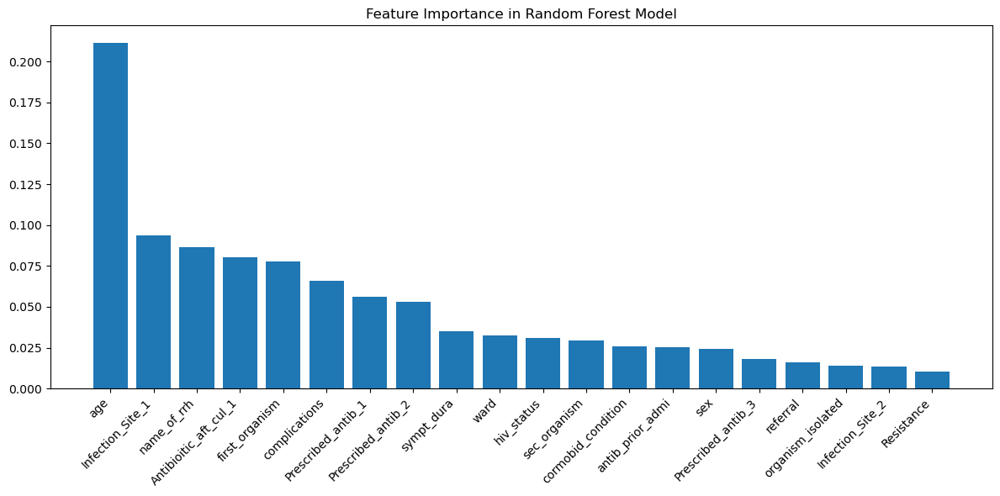

In [173]:
# Get feature importances
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nFeature Importance with Best Parameters:")
print(feature_importance)

# Visualize feature importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance['feature'], feature_importance['importance'])
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance in Random Forest Model')
plt.tight_layout()
plt.show()

In [174]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
import pandas as pd

# Prepare the data
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])

# Define custom scorer for original scale RMSE
def custom_rmse_scorer(y_true, y_pred):
    return np.sqrt(mean_squared_error(np.expm1(y_true), np.expm1(y_pred)))

rmse_scorer = make_scorer(custom_rmse_scorer, greater_is_better=False)

# Define parameter distributions
param_dist = {
    'n_estimators': [500, 750, 1000, 1250],
    'max_features': [0.6, 0.7, 0.8, 0.9],
    'min_samples_split': [2, 4, 6, 8, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_depth': [None, 10, 20, 30],
    'bootstrap': [True, False]
}

# Create Random Forest model
rf = RandomForestRegressor(random_state=1)

# Perform randomized search
random_search = RandomizedSearchCV(
    rf,
    param_distributions=param_dist,
    n_iter=50,
    cv=5,
    scoring=rmse_scorer,
    n_jobs=-1,
    random_state=1,
    verbose=1
)

# Fit the random search
random_search.fit(X, y)

# Print results
print("Best parameters found:")
print(random_search.best_params_)
print("\nBest RMSE:", -random_search.best_score_)

# Get all results
results = pd.DataFrame(random_search.cv_results_)
results = results.sort_values('mean_test_score', ascending=False)

# Print top 5 combinations
print("\nTop 5 parameter combinations:")
for i in range(5):
    params = results.iloc[i]['params']
    score = -results.iloc[i]['mean_test_score']
    std = results.iloc[i]['std_test_score']
    print(f"\nRank {i+1}:")
    print(f"Parameters: {params}")
    print(f"RMSE: {score:.2f} (+/- {std*2:.2f})")

# Train best model and get feature importance
best_model = RandomForestRegressor(**random_search.best_params_, random_state=1)
best_model.fit(X, y)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters found:
{'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.7, 'max_depth': 30, 'bootstrap': True}

Best RMSE: 39.10898672023901

Top 5 parameter combinations:

Rank 1:
Parameters: {'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.7, 'max_depth': 30, 'bootstrap': True}
RMSE: 39.11 (+/- 57.19)

Rank 2:
Parameters: {'n_estimators': 1000, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 0.9, 'max_depth': 30, 'bootstrap': True}
RMSE: 39.11 (+/- 56.92)

Rank 3:
Parameters: {'n_estimators': 750, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.8, 'max_depth': None, 'bootstrap': True}
RMSE: 39.12 (+/- 56.96)

Rank 4:
Parameters: {'n_estimators': 1000, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.8, 'max_depth': 10, 'bootstrap': True}
RMSE: 39.13 (+/- 56.96)

Rank 5:
Parameters: {'n_estimators': 10

RandomForestRegressor(max_depth=30, max_features=0.7, min_samples_leaf=4,
                      n_estimators=500, random_state=1)

# GradientBoostingRegressor

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run upset-bass-776 at: http://127.0.0.1:8080/#/experiments/320510952361426209/runs/c29dcbf9b85042b6aa66e6d0c02ea844
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/320510952361426209
Mean Absolute Error: 16.98
Root Mean Squared Error: 25.66
R-squared Score: 0.0846


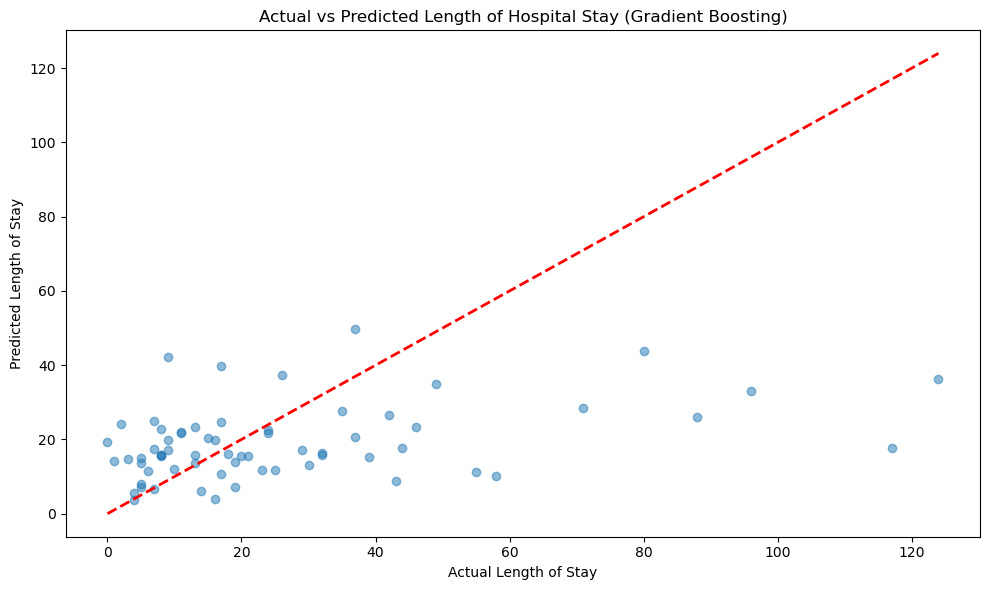

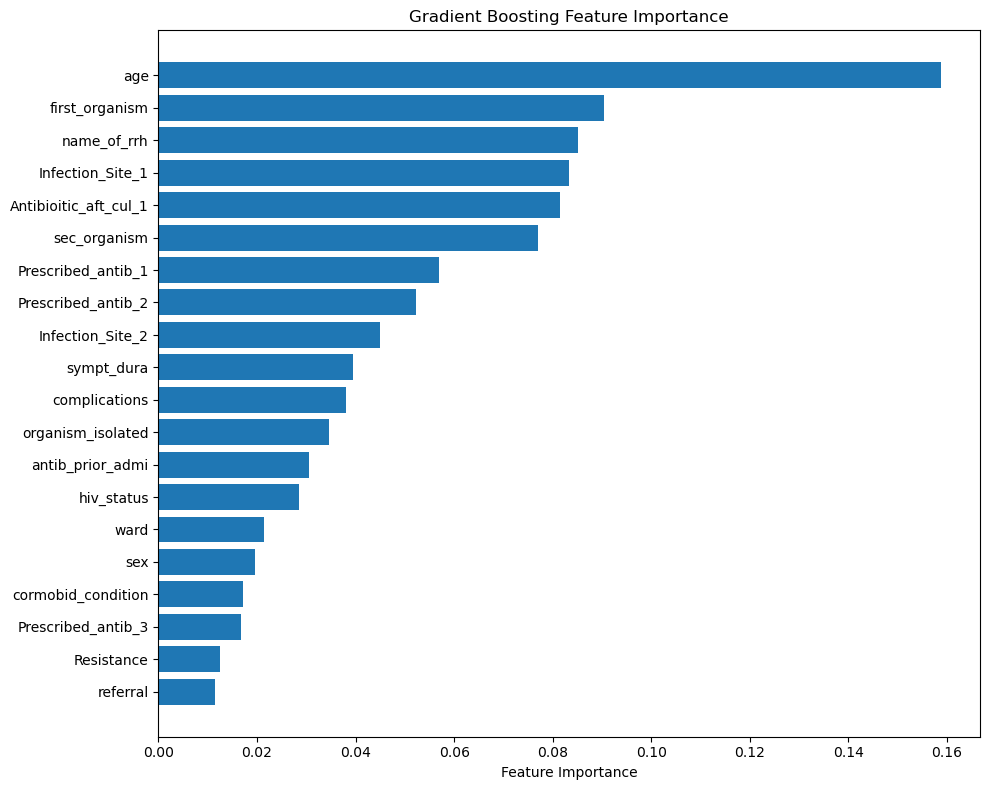

In [175]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Gradient Boosting
params = {
    'random_state': 10,
    'n_estimators': 3000,         # Significantly increased for better fit
    'learning_rate': 0.008751328233611147,       # Further reduced for more precise corrections
    'max_depth': 8,               # Increased to capture more complex patterns
    'min_samples_split': 2,       # Minimum value to create highly specialized trees
    'min_samples_leaf': 1,        # Minimum value for maximum tree detail
    'subsample': 0.7135681866731614,            # Increased to use more of the training data
    'max_features': 0.6975751180009072,          # Using most features for splits
    # 'loss': 'ls',      # Direct optimization for MSE
    'validation_fraction': 0.2,   # For early stopping
    'n_iter_no_change': 100,      # For early stopping
    'tol': 1e-5                   # For early stopping
}

# {
#     'learning_rate': 0.008751328233611147,
#     'loss': 'ls', 
#     'max_depth': 4, 
#     'max_features': 0.6975751180009072, 
#     'min_samples_leaf': 4, 
#     'min_samples_split': 9, 
#     'n_estimators': 2275, 
#     'subsample': 0.7135681866731614
#     }


# Initialize and train the Gradient Boosting Regressor
gb = GradientBoostingRegressor(**params)
gb.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = gb.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(gb, "GB_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = gb.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [176]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow GB Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "GB_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, gb.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="GB Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'GB Regressor model' already exists. Creating a new version of this model...
2025/03/04 08:53:45 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model 

🏃 View run rebellious-doe-497 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/d06f30905981414085ee895364bc43e0
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334


Created version '30' of model 'GB Regressor model'.


Starting hyperparameter tuning with RandomizedSearchCV...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END learning_rate=0.004745401188473625, max_depth=7, max_features=0.5917173949330818, min_samples_leaf=8, min_samples_split=14, n_estimators=2638, subsample=0.8337498258560773; total time=   0.0s
[CV] END learning_rate=0.001999749158180029, max_depth=5, max_features=0.9330880728874675, min_samples_leaf=4, min_samples_split=9, n_estimators=1130, subsample=0.7061753482887407; total time=   0.1s
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692763545078751, min_samples_leaf=2, min_samples_split=13, n_estimators=3324, subsample=0.8852444528883149; total time=   0.1s
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692763545078751, min_samples_leaf=2, min_samples_split=13, n_estimators=3324, subsample=0.8852444528883149; total time=   0.1s
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run nosy-moth-739 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/4a22a3acc01e4d7a907005da01638dae
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334

Final Model Performance on Test Set:
Mean Absolute Error: 15.63
Root Mean Squared Error: 25.16
R-squared Score: 0.1199


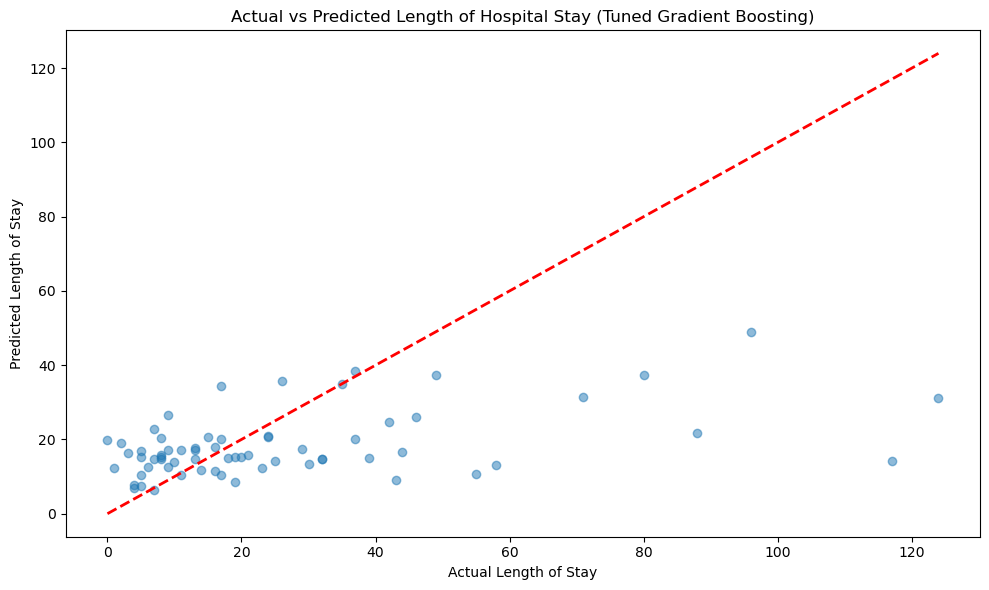

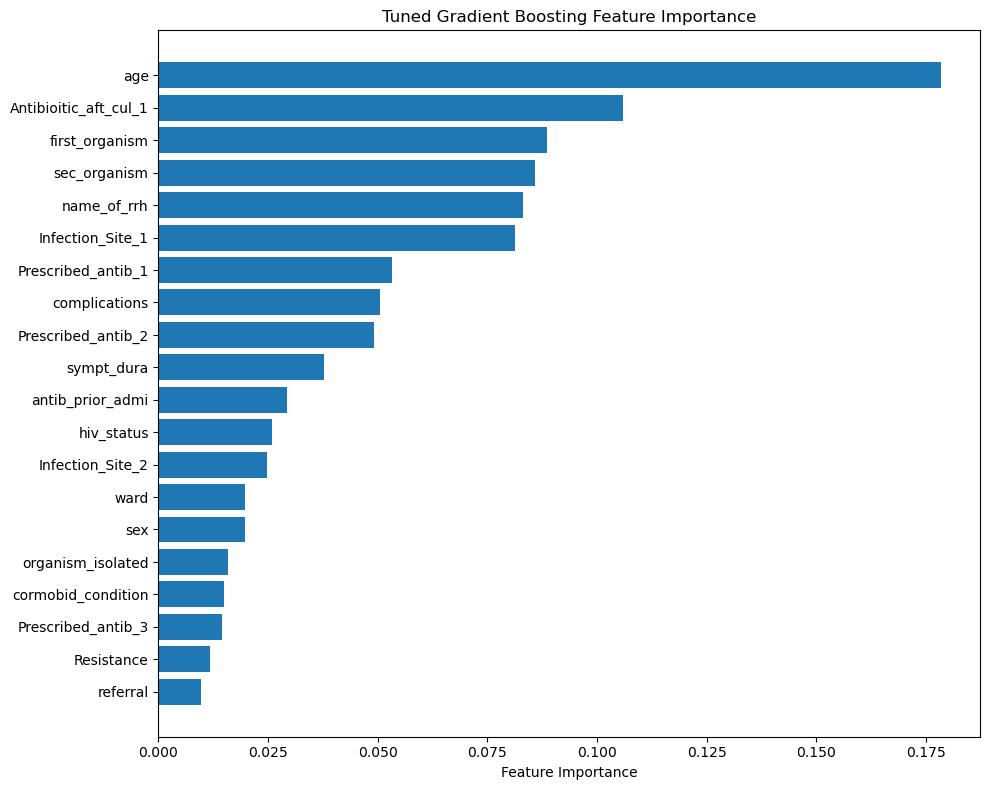

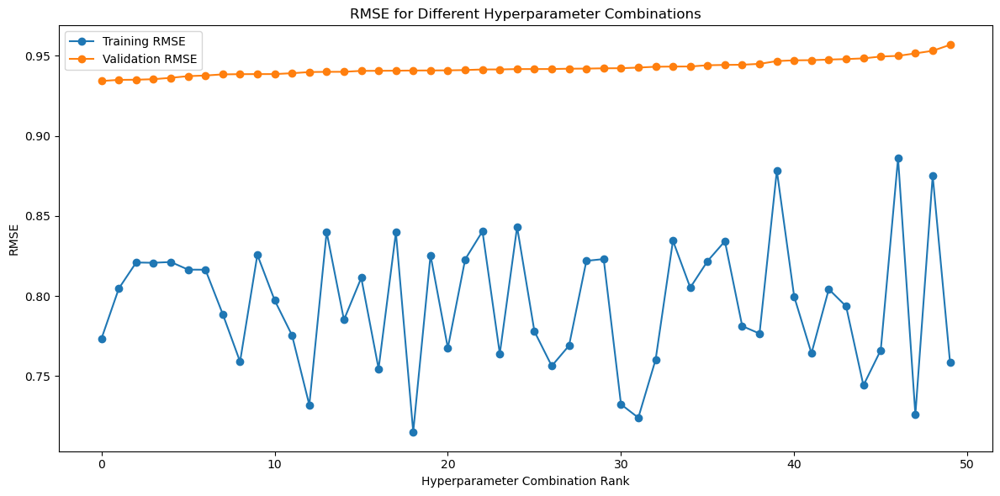

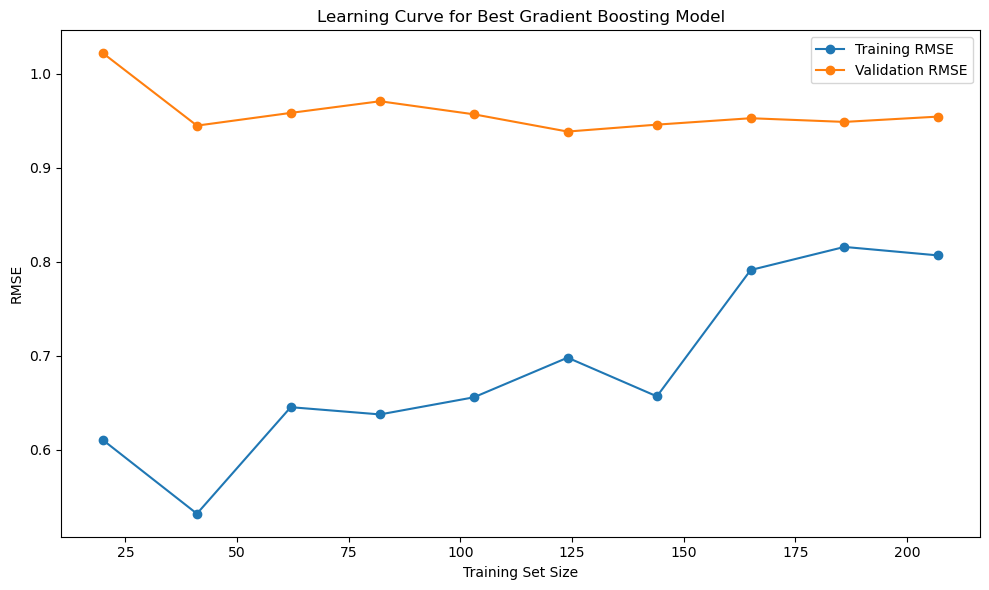

In [177]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
from scipy.stats import randint, uniform

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the hyperparameter search space for Gradient Boosting
param_distributions = {
    'n_estimators': randint(1000, 3500),
    'learning_rate': uniform(0.001, 0.01),
    'max_depth': randint(3, 10),
    'min_samples_split': randint(2, 15),
    'min_samples_leaf': randint(1, 10),
    'subsample': uniform(0.7, 0.3),  # This means from 0.7 to 1.0
    'max_features': uniform(0.5, 0.5),  # This means from 0.5 to 1.0
    # 'loss': ['ls'],  # Since we're focused on squared error
}

# Initialize the base model
base_model = GradientBoostingRegressor(
    random_state=10,
    validation_fraction=0.2,
    n_iter_no_change=50,
    tol=1e-5
)

# Set up cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=base_model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of parameter settings sampled
    cv=cv,
    scoring='neg_mean_squared_error',
    random_state=42,
    n_jobs=-1,  # Use all available processors
    verbose=2,
    return_train_score=True
)

# Perform the randomized search
print("Starting hyperparameter tuning with RandomizedSearchCV...")
random_search.fit(X_train, y_train)

# Print the best parameters and best score
print("\nBest parameters found:")
print(random_search.best_params_)
print(f"Best RMSE: {np.sqrt(-random_search.best_score_)}")

# Get the best model
best_gb = random_search.best_estimator_

# Make predictions and inverse transform them
y_pred_log = best_gb.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the best model and metrics with MLflow
with mlflow.start_run():
    # Log best parameters
    mlflow.log_params(random_search.best_params_)
    
    # Log metrics
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(best_gb, "best_GB_regressor_model", signature=signature)

# Print the metrics
print("\nFinal Model Performance on Test Set:")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Create a scatter plot to visualize predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
         [y_test_original.min(), y_test_original.max()],
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Tuned Gradient Boosting)')
plt.tight_layout()
plt.savefig('gb_predictions_vs_actual.png')
plt.show()

# Feature importance plot for the best model
feature_importance = best_gb.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Tuned Gradient Boosting Feature Importance')
plt.tight_layout()
plt.savefig('gb_feature_importance.png')
plt.show()

# Plot learning curves of the hyperparameter search
results = random_search.cv_results_
plt.figure(figsize=(12, 6))

# Get indices sorted by rank
sorted_indices = np.argsort(results['rank_test_score'])

# Plot the RMSE for each hyperparameter combination
train_scores = -results['mean_train_score'][sorted_indices]
test_scores = -results['mean_test_score'][sorted_indices]
plt.plot(range(len(sorted_indices)), np.sqrt(train_scores), 'o-', label='Training RMSE')
plt.plot(range(len(sorted_indices)), np.sqrt(test_scores), 'o-', label='Validation RMSE')
plt.xlabel('Hyperparameter Combination Rank')
plt.ylabel('RMSE')
plt.title('RMSE for Different Hyperparameter Combinations')
plt.legend()
plt.tight_layout()
plt.savefig('gb_hyperparameter_search_results.png')
plt.show()

# Optional: Plot learning curve of the best model
from sklearn.model_selection import learning_curve

train_sizes, train_scores, valid_scores = learning_curve(
    best_gb, X_train, y_train, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Calculate RMSE from MSE
train_rmse = np.sqrt(-np.mean(train_scores, axis=1))
valid_rmse = np.sqrt(-np.mean(valid_scores, axis=1))

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_rmse, 'o-', label='Training RMSE')
plt.plot(train_sizes, valid_rmse, 'o-', label='Validation RMSE')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.title('Learning Curve for Best Gradient Boosting Model')
plt.legend()
plt.tight_layout()
plt.savefig('gb_learning_curve.png')
plt.show()

# Light gbm regressor

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 259, number of used features: 20
[LightGBM] [Info] Start training from score 2.905777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run redolent-rat-369 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/197968a50afb4c1ea8ecbcdb8ad7fb89
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334
Mean Absolute Error: 16.97
Root Mean Squared Error: 26.77
R-squared Score: 0.0039


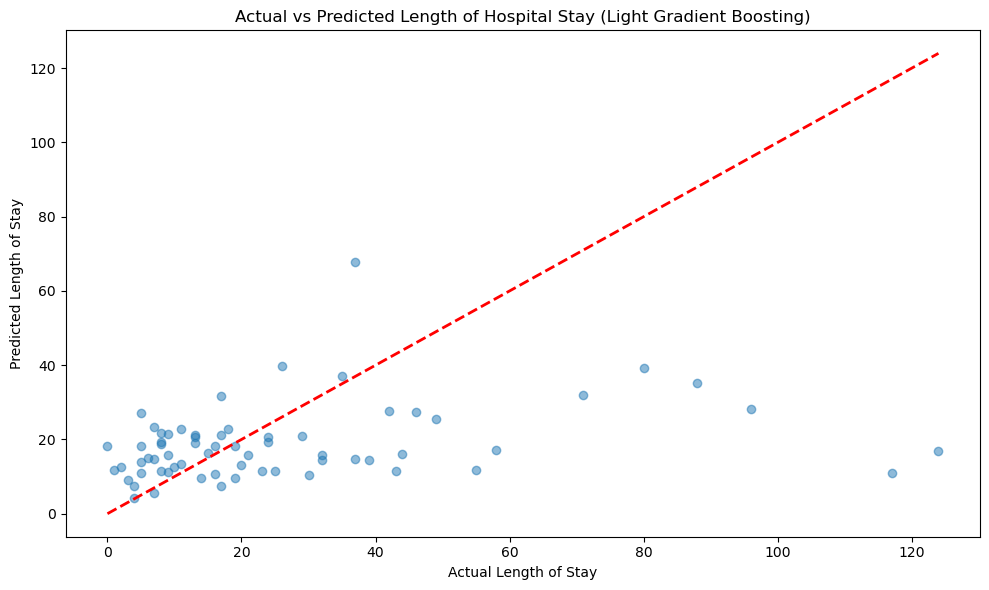

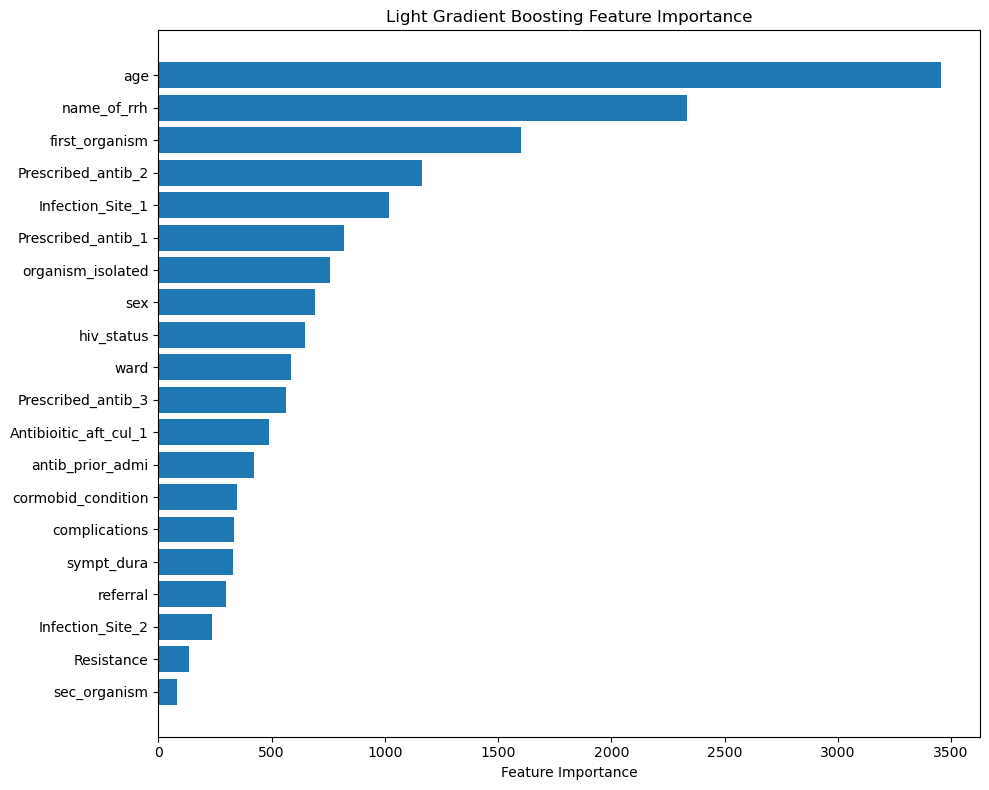

In [178]:
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'objective' : 'regression',
    'random_state': 10,
    'n_estimators': 2500,         # Significantly increased for better fit
    'learning_rate': 0.005,       # Further reduced for more precise corrections
    'max_depth': 4,               # Increased to capture more complex patterns
    'num_leaves': 85, 
    'boosting_type' : 'gbdt',
    'subsample_for_bin'  : 25000               
}

# Initialize and train the Light Gradient Boosting Regressor
lgbm = LGBMRegressor(**params)
lgbm.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lgbm.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lgbm, "LGBM_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Light Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = lgbm.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Light Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [ ]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow LGBM Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "LGBM_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="LGBM Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


In [ ]:
import optuna

# Ensure growth is defined
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    params = {
        'objective': 'regression',
        'boosting_type': 'gbdt',
        'random_state': 10,
        'n_estimators': trial.suggest_int('n_estimators', 1000, 3000, step=500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.02, log=True),
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150, step=10),
        'subsample_for_bin': trial.suggest_int('subsample_for_bin', 20000, 50000, step=5000),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50, step=5),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
    }

    # Train model
    lgbm = LGBMRegressor(**params)
    lgbm.fit(X_train, y_train, eval_set=[(X_test, y_test)])
    
    # Predict and evaluate
    y_pred_log = lgbm.predict(X_test)
    y_pred = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)
    
    mae = mean_absolute_error(y_test_original, y_pred)
    return mae  # Minimizing MAE

# Run Optuna optimization
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

# Get best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)

# Train final model with best parameters
lgbm_final = LGBMRegressor(**best_params)
lgbm_final.fit(X_train, y_train)

# Evaluate on test set
y_pred_log = lgbm_final.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_test_original = np.expm1(y_test)

mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log best model with MLflow
with mlflow.start_run():
    mlflow.log_params(best_params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    mlflow.sklearn.log_model(lgbm_final, "LGBM_regressor_optimized")

# Print final metrics
print(f"Optimized Mean Absolute Error: {mae:.2f}")
print(f"Optimized Root Mean Squared Error: {rmse:.2f}")
print(f"Optimized R-squared Score: {r2:.4f}")

[I 2025-03-03 09:50:17,120] A new study created in memory with name: no-name-8434277f-4849-4c0d-9a78-e10203f2b130


[LightGBM] [Warning] lambda_l2 is set=2.0869658900313746e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0869658900313746e-08
[LightGBM] [Warning] lambda_l1 is set=2.044771512203023e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.044771512203023e-05
[LightGBM] [Warning] lambda_l2 is set=2.0869658900313746e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0869658900313746e-08
[LightGBM] [Warning] lambda_l1 is set=2.044771512203023e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.044771512203023e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002451 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 259, number of used features: 23
[LightGBM] [Warning] lambda_l2 is set=2.0869658900313746e-08, reg_lambda=0.0 will be ign

[I 2025-03-03 09:50:18,959] Trial 0 finished with value: 16.02252037224392 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0036344446258959437, 'max_depth': 5, 'num_leaves': 70, 'subsample_for_bin': 35000, 'min_child_samples': 10, 'lambda_l1': 2.044771512203023e-05, 'lambda_l2': 2.0869658900313746e-08}. Best is trial 0 with value: 16.02252037224392.


[LightGBM] [Warning] lambda_l2 is set=2.0869658900313746e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0869658900313746e-08
[LightGBM] [Warning] lambda_l1 is set=2.044771512203023e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.044771512203023e-05
[LightGBM] [Warning] lambda_l2 is set=1.735646816184963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.735646816184963
[LightGBM] [Warning] lambda_l1 is set=0.2333058892377384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2333058892377384
[LightGBM] [Warning] lambda_l2 is set=1.735646816184963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.735646816184963
[LightGBM] [Warning] lambda_l1 is set=0.2333058892377384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2333058892377384
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough

[I 2025-03-03 09:50:20,102] Trial 1 finished with value: 16.02846886743354 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0010853038817223203, 'max_depth': 6, 'num_leaves': 130, 'subsample_for_bin': 20000, 'min_child_samples': 40, 'lambda_l1': 0.2333058892377384, 'lambda_l2': 1.735646816184963}. Best is trial 0 with value: 16.02252037224392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:22,501] Trial 2 finished with value: 15.404800902677694 and parameters: {'n_estimators': 2500, 'learning_rate': 0.003948753075655316, 'max_depth': 8, 'num_leaves': 70, 'subsample_for_bin': 30000, 'min_child_samples': 25, 'lambda_l1': 5.7191111863333335, 'lambda_l2': 7.553629790400192e-07}. Best is trial 2 with value: 15.404800902677694.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:32,547] Trial 3 finished with value: 15.536391581511083 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0029743193871799877, 'max_depth': 7, 'num_leaves': 100, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 6.2308961103351705e-06, 'lambda_l2': 0.0006972487658069307}. Best is trial 2 with value: 15.404800902677694.


[LightGBM] [Warning] lambda_l2 is set=0.006293426747074053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006293426747074053
[LightGBM] [Warning] lambda_l1 is set=1.0335509353793962e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0335509353793962e-06
[LightGBM] [Warning] lambda_l2 is set=0.006293426747074053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006293426747074053
[LightGBM] [Warning] lambda_l1 is set=1.0335509353793962e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0335509353793962e-06
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 259, number of used features: 23
[LightGBM] [Warning] lambda_l2 is set=0.006293426747074053, reg_lambda=0.0 will be ignored. 

[I 2025-03-03 09:50:36,931] Trial 4 finished with value: 16.538650584554794 and parameters: {'n_estimators': 2500, 'learning_rate': 0.00402952258775715, 'max_depth': 5, 'num_leaves': 140, 'subsample_for_bin': 35000, 'min_child_samples': 10, 'lambda_l1': 1.0335509353793962e-06, 'lambda_l2': 0.006293426747074053}. Best is trial 2 with value: 15.404800902677694.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:39,246] Trial 5 finished with value: 15.703706254525661 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0011576707417853764, 'max_depth': 10, 'num_leaves': 60, 'subsample_for_bin': 40000, 'min_child_samples': 35, 'lambda_l1': 4.33976358165454e-06, 'lambda_l2': 1.6059324779748692e-06}. Best is trial 2 with value: 15.404800902677694.


[LightGBM] [Warning] lambda_l2 is set=1.6059324779748692e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6059324779748692e-06
[LightGBM] [Warning] lambda_l1 is set=4.33976358165454e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.33976358165454e-06
[LightGBM] [Warning] lambda_l2 is set=9.424308819964821e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.424308819964821e-06
[LightGBM] [Warning] lambda_l1 is set=3.127703550781269e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127703550781269e-07
[LightGBM] [Warning] lambda_l2 is set=9.424308819964821e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.424308819964821e-06
[LightGBM] [Warning] lambda_l1 is set=3.127703550781269e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127703550781269e-07
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_row_wise=true` to remove the overhead.
A

[I 2025-03-03 09:50:40,346] Trial 6 finished with value: 15.434977340922686 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0016705548467503381, 'max_depth': 3, 'num_leaves': 110, 'subsample_for_bin': 35000, 'min_child_samples': 30, 'lambda_l1': 3.127703550781269e-07, 'lambda_l2': 9.424308819964821e-06}. Best is trial 2 with value: 15.404800902677694.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:41,908] Trial 7 finished with value: 15.894172860984725 and parameters: {'n_estimators': 2500, 'learning_rate': 0.007067504403352322, 'max_depth': 9, 'num_leaves': 110, 'subsample_for_bin': 30000, 'min_child_samples': 45, 'lambda_l1': 2.1905529397367993, 'lambda_l2': 2.8566674906780414e-07}. Best is trial 2 with value: 15.404800902677694.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:43,984] Trial 8 finished with value: 16.149543624623387 and parameters: {'n_estimators': 2500, 'learning_rate': 0.012847852451538735, 'max_depth': 5, 'num_leaves': 140, 'subsample_for_bin': 45000, 'min_child_samples': 40, 'lambda_l1': 0.00017121492724190554, 'lambda_l2': 4.7572094931986296e-08}. Best is trial 2 with value: 15.404800902677694.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:45,559] Trial 9 finished with value: 15.182520576111969 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0014433693539417252, 'max_depth': 3, 'num_leaves': 20, 'subsample_for_bin': 25000, 'min_child_samples': 15, 'lambda_l1': 1.0476067006351457, 'lambda_l2': 1.5551135165468857e-08}. Best is trial 9 with value: 15.182520576111969.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:46,203] Trial 10 finished with value: 15.719937427728773 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0024130836408218564, 'max_depth': 2, 'num_leaves': 20, 'subsample_for_bin': 50000, 'min_child_samples': 20, 'lambda_l1': 0.020546193795652222, 'lambda_l2': 0.083298638184509}. Best is trial 9 with value: 15.182520576111969.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:47,224] Trial 11 finished with value: 15.430413462150657 and parameters: {'n_estimators': 2000, 'learning_rate': 0.00835393438502159, 'max_depth': 8, 'num_leaves': 20, 'subsample_for_bin': 25000, 'min_child_samples': 20, 'lambda_l1': 7.515717468643629, 'lambda_l2': 2.5416691178896786e-05}. Best is trial 9 with value: 15.182520576111969.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-03-03 09:50:48,791] Trial 12 finished with value: 15.304079252743406 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0017628992137159877, 'max_depth': 3, 'num_leaves': 50, 'subsample_for_bin': 25000, 'min_child_samples': 25, 'lambda_l1': 0.0027028568872532114, 'lambda_l2': 1.1001015075423369e-08}. Best is trial 9 with value: 15.182520576111969.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:50,028] Trial 13 finished with value: 14.969376947727675 and parameters: {'n_estimators': 1500, 'learning_rate': 0.002076256852410167, 'max_depth': 3, 'num_leaves': 40, 'subsample_for_bin': 25000, 'min_child_samples': 20, 'lambda_l1': 0.0036893084309958845, 'lambda_l2': 1.2030483918281573e-08}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:50,865] Trial 14 finished with value: 15.64677741211176 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0018299879137641884, 'max_depth': 2, 'num_leaves': 40, 'subsample_for_bin': 25000, 'min_child_samples': 15, 'lambda_l1': 0.050860397273370585, 'lambda_l2': 6.813658100857934e-05}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:52,456] Trial 15 finished with value: 16.42181048764787 and parameters: {'n_estimators': 1500, 'learning_rate': 0.01971968807183121, 'max_depth': 4, 'num_leaves': 40, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 1.557120147226159e-08, 'lambda_l2': 4.1817696385459986e-07}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:53,530] Trial 16 finished with value: 15.215509812854219 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0023637487356018413, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.0006976775224269004, 'lambda_l2': 0.0005851073080234602}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:55,185] Trial 17 finished with value: 15.613380604455424 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0014057886201503356, 'max_depth': 4, 'num_leaves': 90, 'subsample_for_bin': 25000, 'min_child_samples': 30, 'lambda_l1': 0.35129625569587397, 'lambda_l2': 6.511282472541951e-08}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] lambda_l2 is set=6.511282472541951e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511282472541951e-08
[LightGBM] [Warning] lambda_l1 is set=0.35129625569587397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35129625569587397
[LightGBM] [Warning] lambda_l2 is set=3.605346838488246e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.605346838488246e-06
[LightGBM] [Warning] lambda_l1 is set=0.005727029430526413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005727029430526413
[LightGBM] [Warning] lambda_l2 is set=3.605346838488246e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.605346838488246e-06
[LightGBM] [Warning] lambda_l1 is set=0.005727029430526413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005727029430526413
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if me

[I 2025-03-03 09:50:55,947] Trial 18 finished with value: 15.421185687667489 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0023331089755284375, 'max_depth': 2, 'num_leaves': 40, 'subsample_for_bin': 30000, 'min_child_samples': 50, 'lambda_l1': 0.005727029430526413, 'lambda_l2': 3.605346838488246e-06}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:58,160] Trial 19 finished with value: 15.414818608838742 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0010173308304431026, 'max_depth': 4, 'num_leaves': 20, 'subsample_for_bin': 40000, 'min_child_samples': 20, 'lambda_l1': 0.00019872376171800203, 'lambda_l2': 0.00982371298457931}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:50:59,722] Trial 20 finished with value: 16.031717031294527 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0062520992934718585, 'max_depth': 6, 'num_leaves': 60, 'subsample_for_bin': 20000, 'min_child_samples': 15, 'lambda_l1': 0.47677618323138565, 'lambda_l2': 2.0593101641787727e-07}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:00,773] Trial 21 finished with value: 15.219444822943512 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0024289086347080743, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.0012131805206136476, 'lambda_l2': 0.0005740766146043203}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:01,650] Trial 22 finished with value: 15.70744983048507 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0014680324360805915, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 25000, 'min_child_samples': 10, 'lambda_l1': 6.311528511675156e-05, 'lambda_l2': 0.00010853687018814523}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.00010853687018814523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010853687018814523
[LightGBM] [Warning] lambda_l1 is

[I 2025-03-03 09:51:03,796] Trial 23 finished with value: 15.016620233534404 and parameters: {'n_estimators': 1500, 'learning_rate': 0.002042717927278001, 'max_depth': 4, 'num_leaves': 50, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.0007784466326304588, 'lambda_l2': 0.014617891177698093}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:05,893] Trial 24 finished with value: 15.80267658722228 and parameters: {'n_estimators': 1500, 'learning_rate': 0.005503149600931373, 'max_depth': 4, 'num_leaves': 50, 'subsample_for_bin': 25000, 'min_child_samples': 10, 'lambda_l1': 0.022997763867628314, 'lambda_l2': 0.11890928351297639}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.11890928351297639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11890928351297639
[LightGBM] [Warning] lambda_l1 is set=0.022997763867628314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022997763867628314
[LightGBM] [Warning] lambda_l2 is set=5.411686036067933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.411686036067933
[LightGBM] [Warning] lambda_l1 is set=0.007013858591827062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007013858591827062
[LightGBM] [Warning] lambda_l2 is set=5.411686036067933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.411686036067933
[LightGBM] [Warning] lambda_l1 is set=0.007013858591827062, reg_alpha=0.0 will be ignored. Current va

[I 2025-03-03 09:51:06,818] Trial 25 finished with value: 15.446410843613847 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0030376909654597534, 'max_depth': 2, 'num_leaves': 80, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.007013858591827062, 'lambda_l2': 5.411686036067933}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:08,725] Trial 26 finished with value: 15.352870464701914 and parameters: {'n_estimators': 1500, 'learning_rate': 0.001391953190729022, 'max_depth': 5, 'num_leaves': 50, 'subsample_for_bin': 20000, 'min_child_samples': 20, 'lambda_l1': 0.09041967858241347, 'lambda_l2': 0.006651540864311222}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:11,506] Trial 27 finished with value: 15.173936902727512 and parameters: {'n_estimators': 2000, 'learning_rate': 0.001933575887464358, 'max_depth': 4, 'num_leaves': 60, 'subsample_for_bin': 25000, 'min_child_samples': 5, 'lambda_l1': 1.6593640236684961, 'lambda_l2': 0.1257313668120639}. Best is trial 13 with value: 14.969376947727675.


[LightGBM] [Warning] lambda_l2 is set=0.2683260848531681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2683260848531681
[LightGBM] [Warning] lambda_l1 is set=4.848543961108349e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.848543961108349e-05
[LightGBM] [Warning] lambda_l2 is set=0.2683260848531681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2683260848531681
[LightGBM] [Warning] lambda_l1 is set=4.848543961108349e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.848543961108349e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 259, number of used features: 23
[LightGBM] [Warning] lambda_l2 is set=0.2683260848531681, reg_lambda=0.0 will be ignored. Current value:

[I 2025-03-03 09:51:14,274] Trial 28 finished with value: 14.829064819237777 and parameters: {'n_estimators': 2000, 'learning_rate': 0.001970161478828878, 'max_depth': 4, 'num_leaves': 70, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 4.848543961108349e-05, 'lambda_l2': 0.2683260848531681}. Best is trial 28 with value: 14.829064819237777.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:18,563] Trial 29 finished with value: 16.40307747699576 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0032263592898852497, 'max_depth': 5, 'num_leaves': 80, 'subsample_for_bin': 20000, 'min_child_samples': 10, 'lambda_l1': 2.4566388703302318e-05, 'lambda_l2': 0.97845073945047}. Best is trial 28 with value: 14.829064819237777.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:24,710] Trial 30 finished with value: 15.50786832507706 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0020563302999580184, 'max_depth': 7, 'num_leaves': 70, 'subsample_for_bin': 40000, 'min_child_samples': 5, 'lambda_l1': 5.320062603371012e-05, 'lambda_l2': 0.5700090692177149}. Best is trial 28 with value: 14.829064819237777.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:27,337] Trial 31 finished with value: 14.723137265450138 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0020484986313763546, 'max_depth': 4, 'num_leaves': 60, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.0004944664348756718, 'lambda_l2': 0.012564940721149519}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:32,706] Trial 32 finished with value: 15.58910183087707 and parameters: {'n_estimators': 2000, 'learning_rate': 0.004726806612910638, 'max_depth': 6, 'num_leaves': 60, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.0005849911040578351, 'lambda_l2': 0.04681522265545624}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] lambda_l2 is set=0.04681522265545624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04681522265545624
[LightGBM] [Warning] lambda_l1 is set=0.0005849911040578351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005849911040578351
[LightGBM] [Warning] lambda_l2 is set=0.021768011900238315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021768011900238315
[LightGBM] [Warning] lambda_l1 is set=0.001990140249944245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001990140249944245
[LightGBM] [Warning] lambda_l2 is set=0.021768011900238315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021768011900238315
[LightGBM] [Warning] lambda_l1 is set=0.001990140249944245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001990140249944245
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory

[I 2025-03-03 09:51:35,980] Trial 33 finished with value: 16.15566788502227 and parameters: {'n_estimators': 2000, 'learning_rate': 0.003018177291246632, 'max_depth': 5, 'num_leaves': 70, 'subsample_for_bin': 20000, 'min_child_samples': 10, 'lambda_l1': 0.001990140249944245, 'lambda_l2': 0.021768011900238315}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.021768011900238315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021768011900238315
[LightGBM] [Warning] lambda_l1 is set=0.001990140249944245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001990140249944245
[LightGBM] [Warning] lambda_l2 is set=0.0022103289689514548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0022103289689514548
[LightGBM] [Warning] lambda_l1 is set=9.04230647669205e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.04230647669205e-06
[LightGBM] [Warning] lambda_l2 is set=0.0022103289689514548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0022103289689514548
[LightGB

[I 2025-03-03 09:51:38,002] Trial 34 finished with value: 15.67921478090732 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0011814710976278434, 'max_depth': 4, 'num_leaves': 90, 'subsample_for_bin': 20000, 'min_child_samples': 10, 'lambda_l1': 9.04230647669205e-06, 'lambda_l2': 0.0022103289689514548}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:41,961] Trial 35 finished with value: 15.046397896873339 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0035871676776644836, 'max_depth': 4, 'num_leaves': 50, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.00024163210913788306, 'lambda_l2': 0.3169058493158961}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:44,126] Trial 36 finished with value: 15.63212545380482 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0027576236136763518, 'max_depth': 6, 'num_leaves': 80, 'subsample_for_bin': 25000, 'min_child_samples': 25, 'lambda_l1': 1.1604035642580517e-06, 'lambda_l2': 0.02259790169315297}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:51:49,931] Trial 37 finished with value: 16.938022797620512 and parameters: {'n_estimators': 2500, 'learning_rate': 0.004312540250956361, 'max_depth': 7, 'num_leaves': 70, 'subsample_for_bin': 30000, 'min_child_samples': 10, 'lambda_l1': 9.81397683050896e-05, 'lambda_l2': 3.288290701963326}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] lambda_l2 is set=3.288290701963326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.288290701963326
[LightGBM] [Warning] lambda_l1 is set=9.81397683050896e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.81397683050896e-05
[LightGBM] [Warning] lambda_l2 is set=0.0031836303490386988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0031836303490386988
[LightGBM] [Warning] lambda_l1 is set=1.540794235396617e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.540794235396617e-05
[LightGBM] [Warning] lambda_l2 is set=0.0031836303490386988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0031836303490386988
[LightGBM] [Warning] lambda_l1 is set=1.540794235396617e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.540794235396617e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memo

[I 2025-03-03 09:51:55,470] Trial 38 finished with value: 14.764263602328489 and parameters: {'n_estimators': 3000, 'learning_rate': 0.00207444742907634, 'max_depth': 5, 'num_leaves': 100, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 1.540794235396617e-05, 'lambda_l2': 0.0031836303490386988}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lamb

[I 2025-03-03 09:51:58,214] Trial 39 finished with value: 15.932991631422258 and parameters: {'n_estimators': 3000, 'learning_rate': 0.001716039058516899, 'max_depth': 5, 'num_leaves': 120, 'subsample_for_bin': 20000, 'min_child_samples': 35, 'lambda_l1': 1.2523944464044064e-06, 'lambda_l2': 0.002376741981491528}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] lambda_l2 is set=0.002376741981491528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002376741981491528
[LightGBM] [Warning] lambda_l1 is set=1.2523944464044064e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2523944464044064e-06
[LightGBM] [Warning] lambda_l2 is set=0.00016654879590937975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00016654879590937975
[LightGBM] [Warning] lambda_l1 is set=1.3415665833066458e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3415665833066458e-05
[LightGBM] [Warning] lambda_l2 is set=0.00016654879590937975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00016654879590937975
[LightGBM] [Warning] lambda_l1 is set=1.3415665833066458e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3415665833066458e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_row_wise=true` to remove the ove

[I 2025-03-03 09:52:02,557] Trial 40 finished with value: 16.350047368422008 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0035779552969240312, 'max_depth': 5, 'num_leaves': 100, 'subsample_for_bin': 35000, 'min_child_samples': 15, 'lambda_l1': 1.3415665833066458e-05, 'lambda_l2': 0.00016654879590937975}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:52:06,238] Trial 41 finished with value: 14.925114325141468 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0012696431752505872, 'max_depth': 4, 'num_leaves': 100, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 3.901580961942663e-06, 'lambda_l2': 0.002160682148909324}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:52:08,826] Trial 42 finished with value: 15.241130804710108 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0012350702744950625, 'max_depth': 3, 'num_leaves': 100, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 3.174318160067774e-06, 'lambda_l2': 0.002747494428782581}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:52:13,442] Trial 43 finished with value: 15.951456403575394 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0015695954735164416, 'max_depth': 5, 'num_leaves': 110, 'subsample_for_bin': 25000, 'min_child_samples': 10, 'lambda_l1': 7.410946617815803e-08, 'lambda_l2': 0.0010971275806749507}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:52:15,463] Trial 44 finished with value: 15.3038885459215 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0012382603350921517, 'max_depth': 3, 'num_leaves': 150, 'subsample_for_bin': 20000, 'min_child_samples': 10, 'lambda_l1': 2.916656839262544e-07, 'lambda_l2': 3.3795396176257454e-05}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:52:18,923] Trial 45 finished with value: 14.86385590659173 and parameters: {'n_estimators': 2500, 'learning_rate': 0.00263499028055375, 'max_depth': 4, 'num_leaves': 120, 'subsample_for_bin': 25000, 'min_child_samples': 5, 'lambda_l1': 2.634465468824615e-05, 'lambda_l2': 0.33465454547185325}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:52:31,031] Trial 46 finished with value: 15.291982460029365 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0026723184616291944, 'max_depth': 10, 'num_leaves': 120, 'subsample_for_bin': 25000, 'min_child_samples': 5, 'lambda_l1': 2.2309540589250633e-05, 'lambda_l2': 0.24384247925860786}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] lambda_l2 is set=0.049347561060629916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049347561060629916
[LightGBM] [Warning] lambda_l1 is set=6.015969505908947e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015969505908947e-06
[LightGBM] [Warning] lambda_l2 is set=0.049347561060629916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049347561060629916
[LightGBM] [Warning] lambda_l1 is set=6.015969505908947e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015969505908947e-06
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 196
[LightGBM] [Info] Number of data points in the train set: 259, number of used features: 23
[LightGBM] [Warning] lambda_l2 is set=0.049347561060629916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049347561060629916
[LightGBM] [Warning] l

[I 2025-03-03 09:52:38,039] Trial 47 finished with value: 14.739356597912238 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0022768385325644567, 'max_depth': 5, 'num_leaves': 120, 'subsample_for_bin': 50000, 'min_child_samples': 5, 'lambda_l1': 6.015969505908947e-06, 'lambda_l2': 0.049347561060629916}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.049347561060629916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049347561060629916
[LightGBM] [Warning] lambda_l1 is set=6.015969505908947e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.015969505908947e-06
[LightGBM] [Warning] lambda_l2 is set=0.04954099404360923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04954099404360923
[LightGBM] [Warning] lambda_l1 is set=3.455536876116504e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.455536876116504e-05
[LightGBM] [Warning] lambda_l2 is set=0.04954099404360923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04954099404360923
[LightGBM] [Warning] lambda_l1 is set=3.455536876116504e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.455536876116504e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000822 sec

[I 2025-03-03 09:52:43,402] Trial 48 finished with value: 16.302765889394536 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0022480006608288114, 'max_depth': 6, 'num_leaves': 130, 'subsample_for_bin': 50000, 'min_child_samples': 10, 'lambda_l1': 3.455536876116504e-05, 'lambda_l2': 0.04954099404360923}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 09:52:50,964] Trial 49 finished with value: 15.393218513968067 and parameters: {'n_estimators': 3000, 'learning_rate': 0.00270673089557675, 'max_depth': 6, 'num_leaves': 120, 'subsample_for_bin': 45000, 'min_child_samples': 5, 'lambda_l1': 4.934550556624325e-07, 'lambda_l2': 1.2674942034695051}. Best is trial 31 with value: 14.723137265450138.


[LightGBM] [Warning] lambda_l2 is set=1.2674942034695051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2674942034695051
[LightGBM] [Warning] lambda_l1 is set=4.934550556624325e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934550556624325e-07
Best hyperparameters: {'n_estimators': 2000, 'learning_rate': 0.0020484986313763546, 'max_depth': 4, 'num_leaves': 60, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.0004944664348756718, 'lambda_l2': 0.012564940721149519}
[LightGBM] [Warning] lambda_l2 is set=0.012564940721149519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012564940721149519
[LightGBM] [Warning] lambda_l1 is set=0.0004944664348756718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004944664348756718
[LightGBM] [Warning] lambda_l2 is set=0.012564940721149519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012564940721149519
[LightGBM] [Warning] lambda_l1 is set=0.0004944664348756718, reg_alpha

2025/03/03 09:52:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run tasteful-bass-129 at: http://127.0.0.1:8080/#/experiments/822887533196691341/runs/133e9b91e9304701b168609a3fc02f44
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/822887533196691341
Optimized Mean Absolute Error: 14.72
Optimized Root Mean Squared Error: 24.97
Optimized R-squared Score: 0.1333


In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model Selection and Training
# Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

# XGBoost Regressor
xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)

# Model Evaluation
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mae, mse, r2

rf_mae, rf_mse, rf_r2 = evaluate_model(rf_model, X_test, y_test)
xgb_mae, xgb_mse, xgb_r2 = evaluate_model(xgb_model, X_test, y_test)

print(f"Random Forest - MAE: {rf_mae}, MSE: {rf_mse}, R2: {rf_r2}")
print(f"XGBoost - MAE: {xgb_mae}, MSE: {xgb_mse}, R2: {xgb_r2}")

# Hyperparameter Tuning (Example for XGBoost)
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

grid_search = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

best_xgb_model = grid_search.best_estimator_
best_xgb_mae, best_xgb_mse, best_xgb_r2 = evaluate_model(best_xgb_model, X_test, y_test)

print(f"Best XGBoost - MAE: {best_xgb_mae}, MSE: {best_xgb_mse}, R2: {best_xgb_r2}")

Random Forest - MAE: 0.6562941434609361, MSE: 0.7005542231124476, R2: 0.2598222549986896
XGBoost - MAE: 0.6475692399524526, MSE: 0.679212448806502, R2: 0.28237112539150455
Best XGBoost - MAE: 0.6447454344513897, MSE: 0.684910109334236, R2: 0.2763512037607928


# Extreme gradient boost

/home/kyomukama/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [10:12:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "copy_X", "fit_intercept", "max_dept", "max_iter", "positive" } are not used.

  warnings.warn(smsg, UserWarning)
/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_

🏃 View run vaunted-sponge-686 at: http://127.0.0.1:8080/#/experiments/317490332836945887/runs/05e7ad418c9c406aaf92bf982af53cef
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/317490332836945887
Mean Absolute Error: 15.84
Root Mean Squared Error: 26.32
R-squared Score: 0.0371


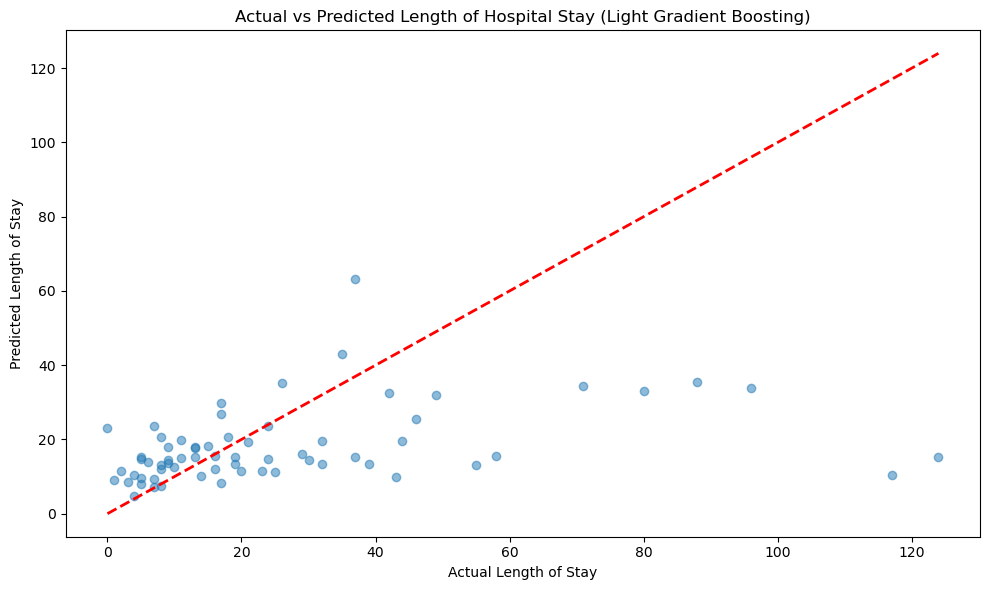

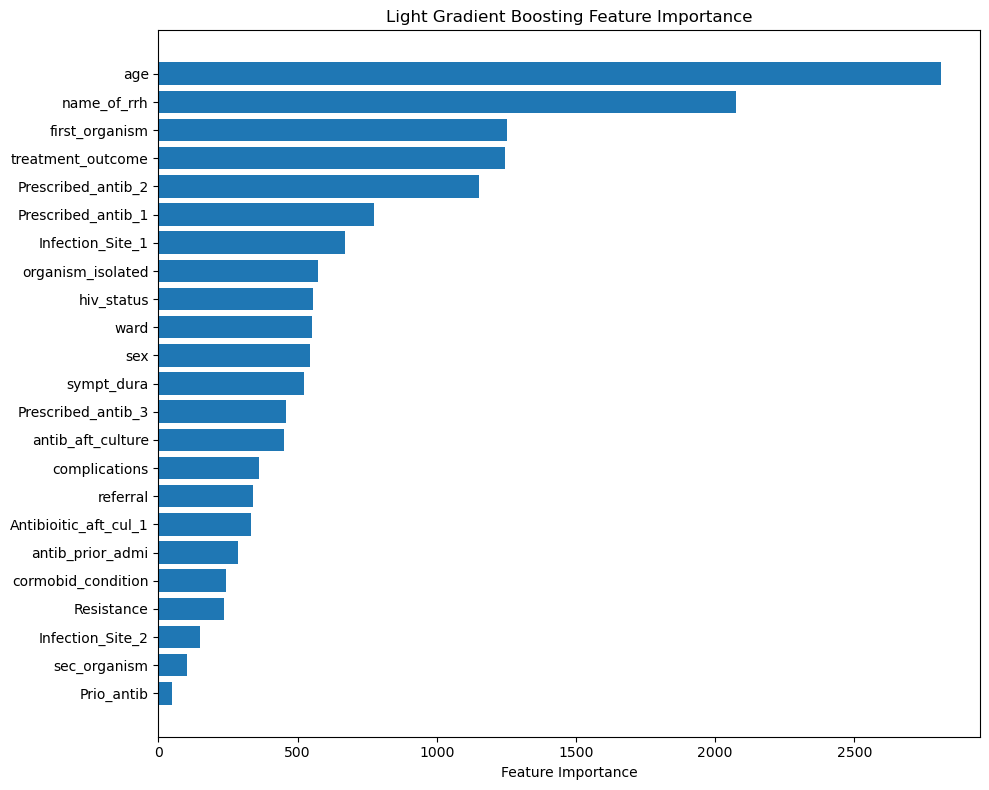

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'positive' : True,
    'random_state': 10,
    'max_iter': 1500,        
    'alpha': 0.006,   
    'fit_intercept': True,               
    'copy_X': True,
    'max_dept': 7,
    'subsample': 0.8,
    'n_estimators': 1000           
}

# Initialize and train the Light Gradient Boosting Regressor
xgb = XGBRegressor(**params)
xgb.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lgbm.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(xgb, "LGBM_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Light Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = lgbm.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Light Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [ ]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow XGB Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "XGB_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="XGB Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'XGB Regressor model' already exists. Creating a new version of this model...
2025/03/03 10:12:29 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model

🏃 View run puzzled-gnu-380 at: http://127.0.0.1:8080/#/experiments/317490332836945887/runs/8e5f4c0e392540ac8cce51729090f7ab
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/317490332836945887


Created version '9' of model 'XGB Regressor model'.


# Lasso Elastic Regressor

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run incongruous-mule-587 at: http://127.0.0.1:8080/#/experiments/317490332836945887/runs/2ac7d968a64849099da503475699c2fb
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/317490332836945887
Mean Absolute Error: 15.59
Root Mean Squared Error: 26.21
R-squared Score: 0.0449


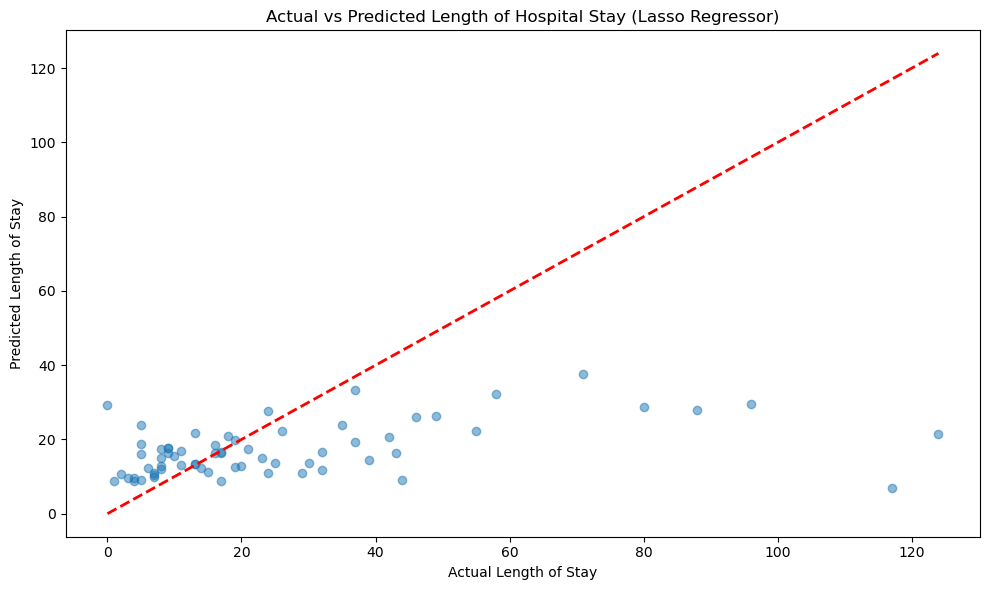

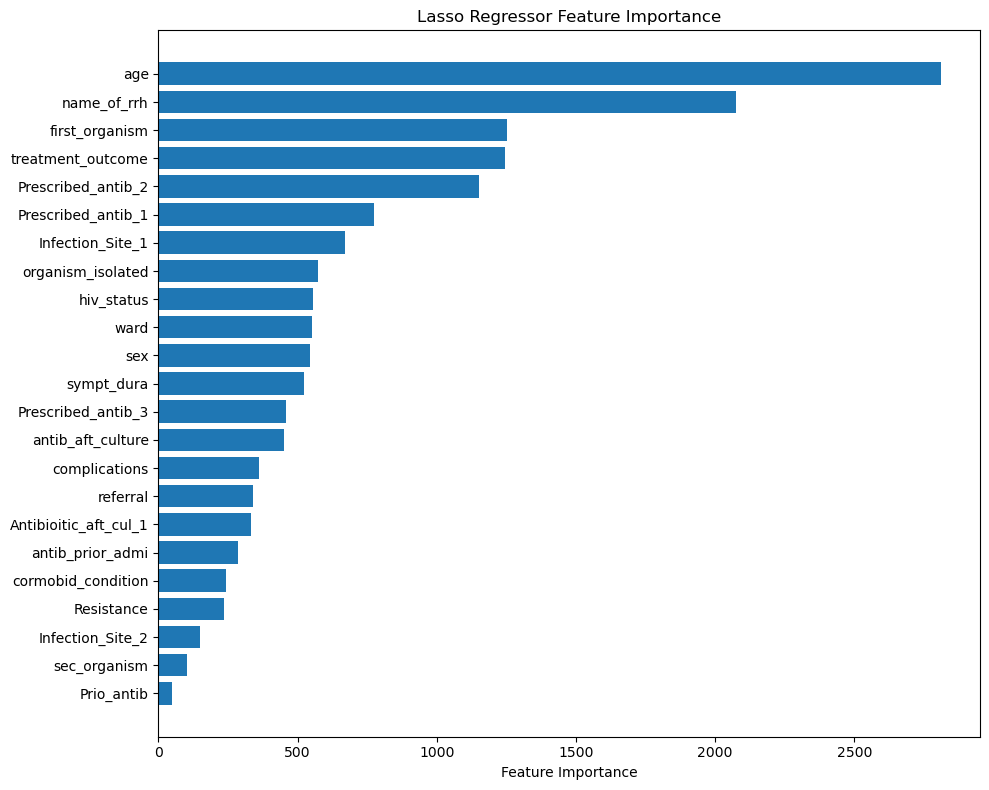

In [ ]:
from sklearn.linear_model import Lasso

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'random_state':10,
    'alpha' : 00.006551,
    'fit_intercept' : True,
    'copy_X' : True,
    'max_iter' : 1500,
    'positive' : True
}


# Initialize and train the Light Gradient Boosting Regressor
lasso = Lasso(**params)
lasso.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lasso, "Lasso_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = lgbm.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Lasso Regressor Feature Importance')
plt.tight_layout()
plt.show()

In [ ]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow Lasso Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Lasso_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="Lasso Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'Lasso Regressor model' already exists. Creating a new version of this model...
2025/03/03 09:53:51 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Mod

🏃 View run bustling-moth-747 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/d06bd9c976c54a109007df2b012b6e59
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799


Created version '7' of model 'Lasso Regressor model'.


Best alpha from cross-validation: 0.006551
CV Mean Absolute Error: 0.7088 ± 0.0876
CV Root Mean Squared Error: 0.9118 ± 0.1095
CV R-squared Score: 0.0580 ± 0.1368


/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run glamorous-newt-408 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/56664cc96e7643aab8e33517cb1dfd80
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799
Test Mean Absolute Error: 15.59
Test Root Mean Squared Error: 26.21
Test R-squared Score: 0.0449


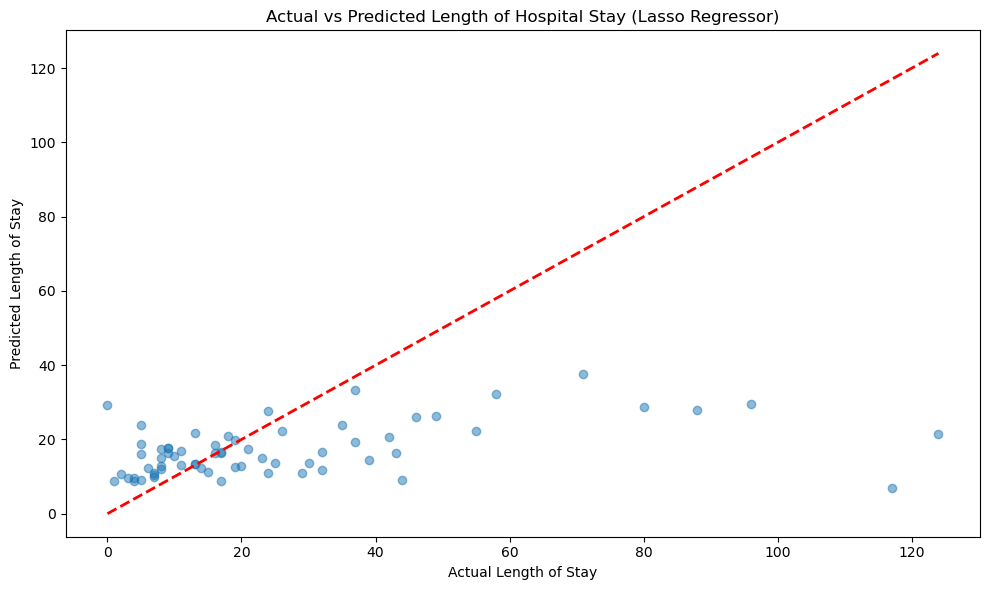

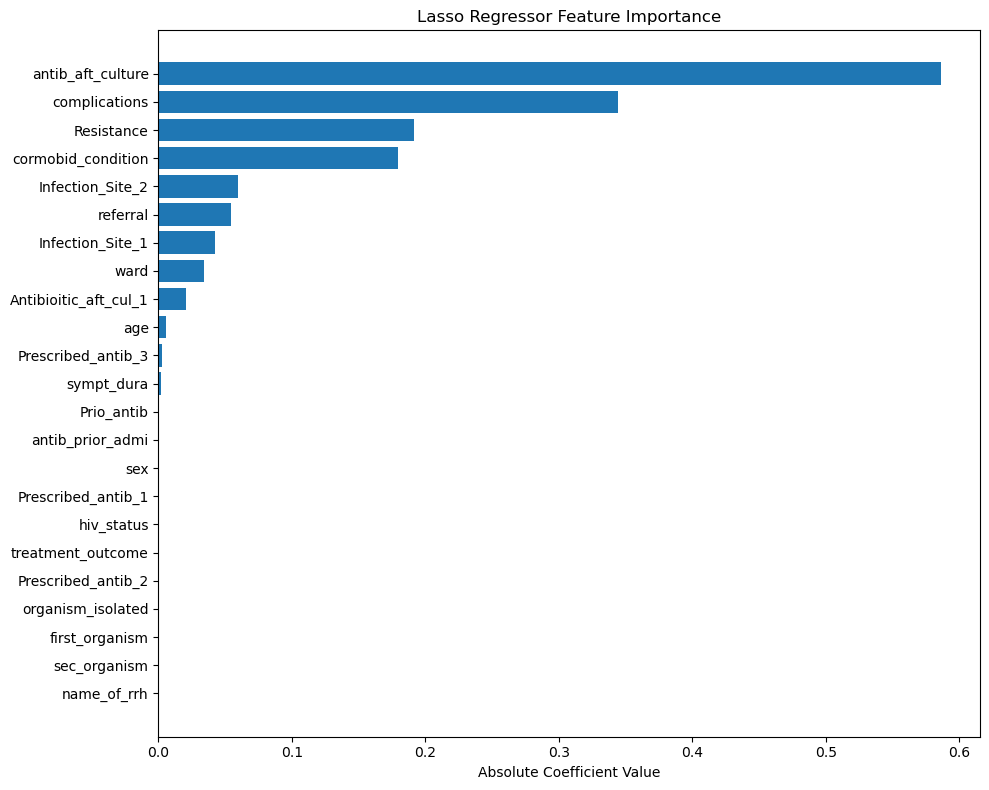

In [ ]:
from sklearn.linear_model import Lasso, LassoCV
from sklearn.model_selection import train_test_split, KFold, cross_val_score

# Apply log transformation to the target variable
X = growth.drop(columns='length_hosp_stay')
y = np.log1p(growth['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 1. First approach: Cross-validation to find optimal alpha
alphas = np.logspace(-3, 1, 50)  # Range of alphas to test
lasso_cv = LassoCV(
    alphas=alphas,
    cv=25,
    random_state=10,
    max_iter=1500,
    positive=True,
    fit_intercept=True
)

# Fit the model
lasso_cv.fit(X_train, y_train)

# Get the best alpha
best_alpha = lasso_cv.alpha_
print(f"Best alpha from cross-validation: {best_alpha:.6f}")

# 2. Second approach: Cross-validation for model evaluation
params = {
    'random_state': 10,
    'alpha': best_alpha,  # Use the best alpha found
    'fit_intercept': True,
    'copy_X': True,
    'max_iter': 1500,
    'positive': True
}

# Initialize the model with the best parameters
lasso = Lasso(**params)

# Setup cross-validation
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Cross-validate and evaluate
cv_mae = -cross_val_score(lasso, X_train, y_train, cv=cv, 
                         scoring='neg_mean_absolute_error', n_jobs=-1)
cv_rmse = np.sqrt(-cross_val_score(lasso, X_train, y_train, cv=cv, 
                                 scoring='neg_mean_squared_error', n_jobs=-1))
cv_r2 = cross_val_score(lasso, X_train, y_train, cv=cv, 
                       scoring='r2', n_jobs=-1)

# Print cross-validation results
print(f"CV Mean Absolute Error: {cv_mae.mean():.4f} ± {cv_mae.std():.4f}")
print(f"CV Root Mean Squared Error: {cv_rmse.mean():.4f} ± {cv_rmse.std():.4f}")
print(f"CV R-squared Score: {cv_r2.mean():.4f} ± {cv_r2.std():.4f}")

# Train the final model with the best parameters on the full training set
final_lasso = Lasso(**params)
final_lasso.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = final_lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("best_alpha", best_alpha)
    mlflow.log_metric("cv_mae_mean", cv_mae.mean())
    mlflow.log_metric("cv_rmse_mean", cv_rmse.mean())
    mlflow.log_metric("cv_r2_mean", cv_r2.mean())
    mlflow.log_metric("test_mae", mae)
    mlflow.log_metric("test_mse", mse)
    mlflow.log_metric("test_rmse", rmse)
    mlflow.log_metric("test_r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred_log)
    mlflow.sklearn.log_model(final_lasso, "Lasso_regressor_model", signature=signature)

# Print the test metrics
print(f"Test Mean Absolute Error: {mae:.2f}")
print(f"Test Root Mean Squared Error: {rmse:.2f}")
print(f"Test R-squared Score: {r2:.4f}")

# Scatter plot for predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
         [y_test_original.min(), y_test_original.max()],
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# Feature importance plot for Lasso using absolute coefficient values
feature_importance = np.abs(final_lasso.coef_)
feature_names = X.columns
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), feature_names[sorted_idx])
plt.xlabel('Absolute Coefficient Value')
plt.title('Lasso Regressor Feature Importance')
plt.tight_layout()
plt.show()